In [4]:
from glob import glob
from pprint import PrettyPrinter
import numpy as np
import re
import os
import shutil
import random  
import pandas as pd

In [5]:
df = pd.read_csv('images/adience/adience.csv')

In [6]:
df

,Unnamed: 0,user_id,original_image,face_id,age,gender,x,y,dx,dy,tilt_ang,fiducial_yaw_angle,fiducial_score
0,0,30601258@N03,10424815813_e94629b1ec_o.jpg,2,"(25, 32)",m,301,105,640,641,0,0,94
1,1,30601258@N03,10437979845_5985be4b26_o.jpg,3,"(25, 32)",m,752,1255,484,485,180,0,47
2,2,30601258@N03,11816644924_075c3d8d59_o.jpg,2,"(25, 32)",m,175,80,769,768,-75,0,34
3,3,30601258@N03,10424595844_1009c687e4_o.jpg,4,"(38, 43)",f,1912,905,1224,1224,155,0,64
4,4,30601258@N03,10190308156_5c748ab2da_o.jpg,2,"(25, 32)",m,1013,1039,453,452,-75,0,59
5,5,30601258@N03,11624488765_9db0b93c94_o.jpg,2,"(25, 32)",m,101,56,740,740,-90,0,75
6,6,30601258@N03,10204739113_0e2ae11708_o.jpg,6,"(25, 32)",m,336,640,841,842,-85,0,94
7,7,30601258@N03,11518638385_cac7193c86_o.jpg,2,"(25, 32)",m,87,20,728,728,-95,0,79
8,8,30601258@N03,11431644464_5510e0b7e9_o.jpg,2,"(25, 32)",m,223,58,780,781,-85,0,40
9,9,30601258@N03,11562657036_5fe2235bed_o.jpg,5,"(25, 32)",f,518,234,444,444,-15,0,78


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13560 entries, 0 to 13559
Data columns (total 13 columns):
Unnamed: 0            13560 non-null int64
user_id               13560 non-null object
original_image        13560 non-null object
face_id               13560 non-null int64
age                   13560 non-null object
gender                12991 non-null object
x                     13560 non-null int64
y                     13560 non-null int64
dx                    13560 non-null int64
dy                    13560 non-null int64
tilt_ang              13560 non-null int64
fiducial_yaw_angle    13560 non-null int64
fiducial_score        13560 non-null int64
dtypes: int64(9), object(4)
memory usage: 1.3+ MB


In [8]:
df=df.dropna()

In [10]:
df.drop(df[df.age =='None'].index, inplace=True)

/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [11]:
df.shape

(12970, 13)

In [12]:
df.head()

,Unnamed: 0,user_id,original_image,face_id,age,gender,x,y,dx,dy,tilt_ang,fiducial_yaw_angle,fiducial_score
0,0,30601258@N03,10424815813_e94629b1ec_o.jpg,2,"(25, 32)",m,301,105,640,641,0,0,94
1,1,30601258@N03,10437979845_5985be4b26_o.jpg,3,"(25, 32)",m,752,1255,484,485,180,0,47
2,2,30601258@N03,11816644924_075c3d8d59_o.jpg,2,"(25, 32)",m,175,80,769,768,-75,0,34
3,3,30601258@N03,10424595844_1009c687e4_o.jpg,4,"(38, 43)",f,1912,905,1224,1224,155,0,64
4,4,30601258@N03,10190308156_5c748ab2da_o.jpg,2,"(25, 32)",m,1013,1039,453,452,-75,0,59


In [13]:
np.floor(np.mean(eval(df.age[13552])))


55.0

In [14]:
df['ave_age']= df['age'].apply(lambda x: np.floor(np.mean(eval(x))))

/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [15]:
df.to_csv('aged_adience.csv')

In [16]:
df.ave_age.value_counts()

28.0    3309
1.0     1817
40.0    1597
5.0     1586
10.0    1584
17.0    1121
80.0     580
50.0     568
35.0     214
13.0     106
22.0      86
34.0      75
23.0      69
55.0      61
45.0      55
29.0      49
36.0      45
3.0       17
57.0      16
43.0       6
58.0       4
2.0        3
42.0       1
15.0       1
Name: ave_age, dtype: int64

In [17]:
age_count= pd.DataFrame(df.ave_age.value_counts())
age_count.head()

,ave_age
28.0,3309
1.0,1817
40.0,1597
5.0,1586
10.0,1584


In [18]:
age_count.to_csv('adience_age_count.csv')

### binned 

In [19]:
age_label = age_count.index

In [23]:
# for age in age_label:
#         os.mkdir('images/adience/test_train_adience/'+ str(age))


{1.0,
 2.0,
 3.0,
 5.0,
 10.0,
 13.0,
 15.0,
 17.0,
 22.0,
 23.0,
 28.0,
 29.0,
 34.0,
 35.0,
 36.0,
 40.0,
 42.0,
 43.0,
 45.0,
 50.0,
 55.0,
 57.0,
 58.0,
 80.0}

In [30]:
def bin_pics(row):
    final_path = 'images/adience/test_train_adience/'
    age = row['ave_age']
    user_id = row['user_id']
    orig_path = 'images/adience/Adience/faces_t/'+row['user_id']+'/'+row['original_image']
    print('************', row, orig_path, final_path+str(age))
    try:
        shutil.move(orig_path, final_path+str(age))
        row['complete'] = 'Yes'
    except:
        row['complete'] = 'No'
        
    return row

In [31]:
df.apply(bin_pics,axis=1)

************ Unnamed: 0                                       0
user_id                               30601258@N03
original_image        10424815813_e94629b1ec_o.jpg
face_id                                          2
age                                       (25, 32)
gender                                           m
x                                              301
y                                              105
dx                                             640
dy                                             641
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  94
ave_age                                         28
Name: 0, dtype: object images/adience/Adience/faces_t/30601258@N03/10424815813_e94629b1ec_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                       0
user_id                               30601258@N03
original_image        1

************ Unnamed: 0                                     89
user_id                              30601258@N03
original_image        9347599043_17243c033d_o.jpg
face_id                                         2
age                                      (25, 32)
gender                                          m
x                                             844
y                                             953
dx                                           1007
dy                                           1007
tilt_ang                                      -75
fiducial_yaw_angle                              0
fiducial_score                                103
ave_age                                        28
Name: 89, dtype: object images/adience/Adience/faces_t/30601258@N03/9347599043_17243c033d_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                      90
user_id                               30601258@N03
original_image        11141063444_5f3

Name: 177, dtype: object images/adience/Adience/faces_t/30601258@N03/11862321136_bec50c2222_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                     178
user_id                               30601258@N03
original_image        10997187524_97cf66d438_o.jpg
face_id                                          2
age                                       (25, 32)
gender                                           m
x                                               31
y                                               41
dx                                             936
dy                                             919
tilt_ang                                      -100
fiducial_yaw_angle                               0
fiducial_score                                 140
ave_age                                         28
Name: 178, dtype: object images/adience/Adience/faces_t/30601258@N03/10997187524_97cf66d438_o.jpg images/adience/test_train_adience/28.0

Name: 261, dtype: object images/adience/Adience/faces_t/30601258@N03/11727437553_c76dbc5128_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                     262
user_id                               30601258@N03
original_image        11624490685_5149cdd585_o.jpg
face_id                                          2
age                                       (25, 32)
gender                                           m
x                                               78
y                                                0
dx                                             941
dy                                             878
tilt_ang                                       -85
fiducial_yaw_angle                               0
fiducial_score                                  56
ave_age                                         28
Name: 262, dtype: object images/adience/Adience/faces_t/30601258@N03/11624490685_5149cdd585_o.jpg images/adience/test_train_adience/28.0

************ Unnamed: 0                                    347
user_id                              30601258@N03
original_image        9350618902_a63fd0639c_o.jpg
face_id                                         7
age                                      (25, 32)
gender                                          f
x                                            1689
y                                            1498
dx                                            242
dy                                            242
tilt_ang                                      -95
fiducial_yaw_angle                              0
fiducial_score                                 20
ave_age                                        28
Name: 347, dtype: object images/adience/Adience/faces_t/30601258@N03/9350618902_a63fd0639c_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                     348
user_id                               30601258@N03
original_image        11096981215_6c

Name: 431, dtype: object images/adience/Adience/faces_t/30601258@N03/9731068591_f8e582793c_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    432
user_id                              30601258@N03
original_image        9159856147_f7812a8085_o.jpg
face_id                                         2
age                                      (25, 32)
gender                                          m
x                                             223
y                                              85
dx                                            700
dy                                            701
tilt_ang                                      -95
fiducial_yaw_angle                              0
fiducial_score                                 80
ave_age                                        28
Name: 432, dtype: object images/adience/Adience/faces_t/30601258@N03/9159856147_f7812a8085_o.jpg images/adience/test_train_adience/28.0
************ Un

Name: 516, dtype: object images/adience/Adience/faces_t/30601258@N03/9257492942_cd74eb4306_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                     517
user_id                               30601258@N03
original_image        10517968476_4dde2659e2_o.jpg
face_id                                          2
age                                       (25, 32)
gender                                           m
x                                              299
y                                               15
dx                                             776
dy                                             776
tilt_ang                                       -10
fiducial_yaw_angle                               0
fiducial_score                                  42
ave_age                                         28
Name: 517, dtype: object images/adience/Adience/faces_t/30601258@N03/10517968476_4dde2659e2_o.jpg images/adience/test_train_adience/28.0


Name: 599, dtype: object images/adience/Adience/faces_t/20254529@N04/11528287254_3e3ddd9d5c_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                     600
user_id                               20254529@N04
original_image        11528377823_a55d0b78d4_o.jpg
face_id                                         18
age                                       (25, 32)
gender                                           m
x                                              514
y                                                0
dx                                             716
dy                                             611
tilt_ang                                      -100
fiducial_yaw_angle                               0
fiducial_score                                 122
ave_age                                         28
Name: 600, dtype: object images/adience/Adience/faces_t/20254529@N04/11528377823_a55d0b78d4_o.jpg images/adience/test_train_adience/28.0

************ Unnamed: 0                                    684
user_id                              20254529@N04
original_image        9403192315_04a31bf1de_o.jpg
face_id                                        14
age                                        (4, 6)
gender                                          f
x                                            1719
y                                             841
dx                                            249
dy                                            249
tilt_ang                                      170
fiducial_yaw_angle                              0
fiducial_score                                138
ave_age                                         5
Name: 684, dtype: object images/adience/Adience/faces_t/20254529@N04/9403192315_04a31bf1de_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                    685
user_id                              20254529@N04
original_image        9405928690_fec4d1

Name: 772, dtype: object images/adience/Adience/faces_t/20254529@N04/9406045278_200f93d5ae_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                     773
user_id                               20254529@N04
original_image        11528330675_b80f9fe294_o.jpg
face_id                                         18
age                                       (25, 32)
gender                                           m
x                                              278
y                                               45
dx                                             682
dy                                             689
tilt_ang                                       -15
fiducial_yaw_angle                               0
fiducial_score                                  95
ave_age                                         28
Name: 773, dtype: object images/adience/Adience/faces_t/20254529@N04/11528330675_b80f9fe294_o.jpg images/adience/test_train_adience/28.0
*

************ Unnamed: 0                                    859
user_id                              20254529@N04
original_image        9401857051_a88537ab31_o.jpg
face_id                                        14
age                                        (4, 6)
gender                                          f
x                                             341
y                                             358
dx                                            540
dy                                            541
tilt_ang                                       10
fiducial_yaw_angle                              0
fiducial_score                                147
ave_age                                         5
Name: 859, dtype: object images/adience/Adience/faces_t/20254529@N04/9401857051_a88537ab31_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                    860
user_id                              20254529@N04
original_image        9405916680_16b184

************ Unnamed: 0                                    945
user_id                              37303189@N08
original_image        8712057834_1013597587_o.jpg
face_id                                        89
age                                      (25, 32)
gender                                          m
x                                             725
y                                             666
dx                                            428
dy                                            428
tilt_ang                                      -15
fiducial_yaw_angle                              0
fiducial_score                                 97
ave_age                                        28
Name: 945, dtype: object images/adience/Adience/faces_t/37303189@N08/8712057834_1013597587_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                     946
user_id                               37303189@N08
original_image        10631380725_49

************ Unnamed: 0                                    1031
user_id                               37303189@N08
original_image        10630920103_cb330a8354_o.jpg
face_id                                         84
age                                         (0, 2)
gender                                           m
x                                              391
y                                               21
dx                                             469
dy                                             468
tilt_ang                                      -100
fiducial_yaw_angle                               0
fiducial_score                                  62
ave_age                                          1
Name: 1031, dtype: object images/adience/Adience/faces_t/37303189@N08/10630920103_cb330a8354_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                    1032
user_id                               37303189@N08
original_image       

************ Unnamed: 0                                    1115
user_id                               62501130@N02
original_image        11298530915_c4278f472b_o.jpg
face_id                                         97
age                                         (0, 2)
gender                                           f
x                                             2481
y                                              814
dx                                             440
dy                                             440
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                 106
ave_age                                          1
Name: 1115, dtype: object images/adience/Adience/faces_t/62501130@N02/11298530915_c4278f472b_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                    1116
user_id                               62501130@N02
original_image       

Name: 1201, dtype: object images/adience/Adience/faces_t/62501130@N02/11286003193_ff2b6b2224_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                    1202
user_id                               62501130@N02
original_image        11399442263_cf62a34848_o.jpg
face_id                                        100
age                                       (25, 32)
gender                                           f
x                                             1574
y                                               19
dx                                             874
dy                                             975
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  18
ave_age                                         28
Name: 1202, dtype: object images/adience/Adience/faces_t/62501130@N02/11399442263_cf62a34848_o.jpg images/adience/test_train_adience/28.

************ Unnamed: 0                                    1287
user_id                               62501130@N02
original_image        11309390123_b528f405e2_o.jpg
face_id                                         97
age                                         (0, 2)
gender                                           f
x                                             1326
y                                              219
dx                                            1759
dy                                            1760
tilt_ang                                        15
fiducial_yaw_angle                               0
fiducial_score                                  32
ave_age                                          1
Name: 1287, dtype: object images/adience/Adience/faces_t/62501130@N02/11309390123_b528f405e2_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                    1288
user_id                               62501130@N02
original_image       

Name: 1372, dtype: object images/adience/Adience/faces_t/10044155@N06/10744892876_47cec7d045_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                    1373
user_id                               10044155@N06
original_image        10744892876_47cec7d045_o.jpg
face_id                                        151
age                                       (48, 53)
gender                                           m
x                                             1021
y                                              302
dx                                             356
dy                                             356
tilt_ang                                        10
fiducial_yaw_angle                               0
fiducial_score                                  41
ave_age                                         50
Name: 1373, dtype: object images/adience/Adience/faces_t/10044155@N06/10744892876_47cec7d045_o.jpg images/adience/test_train_adience/50

************ Unnamed: 0                                    1459
user_id                               10044155@N06
original_image        11344035543_1598217bf9_o.jpg
face_id                                        133
age                                       (38, 43)
gender                                           f
x                                              495
y                                              686
dx                                             383
dy                                             383
tilt_ang                                         5
fiducial_yaw_angle                               0
fiducial_score                                  53
ave_age                                         40
Name: 1459, dtype: object images/adience/Adience/faces_t/10044155@N06/11344035543_1598217bf9_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                    1460
user_id                               10044155@N06
original_image      

Name: 1542, dtype: object images/adience/Adience/faces_t/29671106@N00/11506365876_9478010ab2_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                    1543
user_id                               29671106@N00
original_image        11506365876_9478010ab2_o.jpg
face_id                                        186
age                                         (0, 2)
gender                                           u
x                                             1786
y                                              643
dx                                             293
dy                                             294
tilt_ang                                       -80
fiducial_yaw_angle                               0
fiducial_score                                  66
ave_age                                          1
Name: 1543, dtype: object images/adience/Adience/faces_t/29671106@N00/11506365876_9478010ab2_o.jpg images/adience/test_train_adience/1.

************ Unnamed: 0                                    1628
user_id                               29671106@N00
original_image        11472372306_9105269e8e_o.jpg
face_id                                        186
age                                         (0, 2)
gender                                           u
x                                              533
y                                             1000
dx                                             931
dy                                             931
tilt_ang                                      -110
fiducial_yaw_angle                               0
fiducial_score                                 143
ave_age                                          1
Name: 1628, dtype: object images/adience/Adience/faces_t/29671106@N00/11472372306_9105269e8e_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                    1629
user_id                               29671106@N00
original_image       

************ Unnamed: 0                                    1712
user_id                               29671106@N00
original_image        10211535246_30bfc85b3d_o.jpg
face_id                                        186
age                                         (0, 2)
gender                                           u
x                                             1494
y                                              364
dx                                            1770
dy                                            1773
tilt_ang                                       165
fiducial_yaw_angle                               0
fiducial_score                                  89
ave_age                                          1
Name: 1712, dtype: object images/adience/Adience/faces_t/29671106@N00/10211535246_30bfc85b3d_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                   1713
user_id                              29671106@N00
original_image        8

************ Unnamed: 0                                    1800
user_id                               29671106@N00
original_image        11192901646_bbbb39b24a_o.jpg
face_id                                        187
age                                        (8, 12)
gender                                           f
x                                             1440
y                                             1692
dx                                             306
dy                                             306
tilt_ang                                       180
fiducial_yaw_angle                               0
fiducial_score                                 110
ave_age                                         10
Name: 1800, dtype: object images/adience/Adience/faces_t/29671106@N00/11192901646_bbbb39b24a_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                    1801
user_id                               29671106@N00
original_image      

Name: 1885, dtype: object images/adience/Adience/faces_t/29671106@N00/11417591455_838e9a5569_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                    1886
user_id                               29671106@N00
original_image        11192924936_21bc16711d_o.jpg
face_id                                        198
age                                        (8, 12)
gender                                           m
x                                              111
y                                             1574
dx                                             383
dy                                             383
tilt_ang                                       190
fiducial_yaw_angle                               0
fiducial_score                                  30
ave_age                                         10
Name: 1886, dtype: object images/adience/Adience/faces_t/29671106@N00/11192924936_21bc16711d_o.jpg images/adience/test_train_adience/10.

************ Unnamed: 0                                    1971
user_id                                9017386@N06
original_image        10770601955_e7ecc9ac58_o.jpg
face_id                                        216
age                                       (48, 53)
gender                                           m
x                                              895
y                                              573
dx                                             287
dy                                             287
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  63
ave_age                                         50
Name: 1971, dtype: object images/adience/Adience/faces_t/9017386@N06/10770601955_e7ecc9ac58_o.jpg images/adience/test_train_adience/50.0
************ Unnamed: 0                                    1972
user_id                                9017386@N06
original_image       

************ Unnamed: 0                                    2058
user_id                               63153065@N07
original_image        11938122094_5aa1828422_o.jpg
face_id                                        241
age                                       (25, 32)
gender                                           m
x                                             1525
y                                                0
dx                                             433
dy                                             417
tilt_ang                                       -95
fiducial_yaw_angle                               0
fiducial_score                                  47
ave_age                                         28
Name: 2058, dtype: object images/adience/Adience/faces_t/63153065@N07/11938122094_5aa1828422_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   2059
user_id                              63153065@N07
original_image        

************ Unnamed: 0                                    2143
user_id                               63153065@N07
original_image        11922057534_745df832bb_o.jpg
face_id                                        235
age                                       (25, 32)
gender                                           f
x                                              551
y                                             1217
dx                                             491
dy                                             491
tilt_ang                                      -105
fiducial_yaw_angle                               0
fiducial_score                                  57
ave_age                                         28
Name: 2143, dtype: object images/adience/Adience/faces_t/63153065@N07/11922057534_745df832bb_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   2144
user_id                              63153065@N07
original_image        

Name: 2228, dtype: object images/adience/Adience/faces_t/10406201@N05/9056896064_94f9f13597_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                    2229
user_id                               10406201@N05
original_image        11268871163_deb2d2e2e5_o.jpg
face_id                                        265
age                                        (8, 12)
gender                                           m
x                                             1354
y                                             1102
dx                                             542
dy                                             542
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  49
ave_age                                         10
Name: 2229, dtype: object images/adience/Adience/faces_t/10406201@N05/11268871163_deb2d2e2e5_o.jpg images/adience/test_train_adience/10.

************ Unnamed: 0                                    2313
user_id                               68825596@N05
original_image        11593655385_a5999fdc6d_o.jpg
face_id                                        290
age                                       (15, 20)
gender                                           f
x                                              543
y                                             1235
dx                                             816
dy                                             816
tilt_ang                                      -100
fiducial_yaw_angle                               0
fiducial_score                                  72
ave_age                                         17
Name: 2313, dtype: object images/adience/Adience/faces_t/68825596@N05/11593655385_a5999fdc6d_o.jpg images/adience/test_train_adience/17.0
************ Unnamed: 0                                    2314
user_id                               68825596@N05
original_image      

************ Unnamed: 0                                    2401
user_id                              113804525@N05
original_image        11847372253_57d2035e4d_o.jpg
face_id                                        327
age                                       (25, 32)
gender                                           m
x                                              793
y                                              489
dx                                             459
dy                                             459
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  74
ave_age                                         28
Name: 2401, dtype: object images/adience/Adience/faces_t/113804525@N05/11847372253_57d2035e4d_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    2402
user_id                              113804525@N05
original_image     

************ Unnamed: 0                                    2496
user_id                              113528649@N08
original_image        11788977235_a8e8555606_o.jpg
face_id                                        333
age                                        (8, 12)
gender                                           f
x                                             1466
y                                             1480
dx                                             287
dy                                             287
tilt_ang                                       170
fiducial_yaw_angle                               0
fiducial_score                                 117
ave_age                                         10
Name: 2496, dtype: object images/adience/Adience/faces_t/113528649@N08/11788977235_a8e8555606_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                    2498
user_id                              113528649@N08
original_image     

************ Unnamed: 0                                   2615
user_id                              20272804@N04
original_image        9837878326_4f7e28d069_o.jpg
face_id                                       343
age                                      (48, 53)
gender                                          m
x                                             465
y                                            1305
dx                                            255
dy                                            255
tilt_ang                                        5
fiducial_yaw_angle                              0
fiducial_score                                 23
ave_age                                        50
Name: 2615, dtype: object images/adience/Adience/faces_t/20272804@N04/9837878326_4f7e28d069_o.jpg images/adience/test_train_adience/50.0
************ Unnamed: 0                                   2616
user_id                              20272804@N04
original_image        9838125533_2bb5

Name: 2701, dtype: object images/adience/Adience/faces_t/16166376@N00/8773642777_4f9196b9b8_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                   2702
user_id                              16166376@N00
original_image        8780056238_ac75f6fdca_o.jpg
face_id                                       355
age                                      (25, 32)
gender                                          f
x                                             516
y                                             322
dx                                            776
dy                                            776
tilt_ang                                       10
fiducial_yaw_angle                              0
fiducial_score                                 84
ave_age                                        28
Name: 2702, dtype: object images/adience/Adience/faces_t/16166376@N00/8780056238_ac75f6fdca_o.jpg images/adience/test_train_adience/28.0
************ U

Name: 2786, dtype: object images/adience/Adience/faces_t/31040257@N06/11853897144_21be84ef26_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    2787
user_id                               31040257@N06
original_image        11853641835_0b07b211d9_o.jpg
face_id                                        359
age                                       (25, 32)
gender                                           f
x                                              728
y                                             1678
dx                                             306
dy                                             306
tilt_ang                                       -85
fiducial_yaw_angle                               0
fiducial_score                                 148
ave_age                                         28
Name: 2787, dtype: object images/adience/Adience/faces_t/31040257@N06/11853641835_0b07b211d9_o.jpg images/adience/test_train_adience/28

Name: 2871, dtype: object images/adience/Adience/faces_t/10241064@N08/8315782664_ec10f62b9c_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                   2872
user_id                              10241064@N08
original_image        8314731033_f30146664a_o.jpg
face_id                                       389
age                                      (25, 32)
gender                                          m
x                                              82
y                                             425
dx                                           1040
dy                                           1039
tilt_ang                                       15
fiducial_yaw_angle                              0
fiducial_score                                107
ave_age                                        28
Name: 2872, dtype: object images/adience/Adience/faces_t/10241064@N08/8314731033_f30146664a_o.jpg images/adience/test_train_adience/28.0
************ 

************ Unnamed: 0                                    2956
user_id                               45666944@N00
original_image        11843038843_7ac9196a08_o.jpg
face_id                                        407
age                                         (4, 6)
gender                                           m
x                                              576
y                                              680
dx                                             791
dy                                             791
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                 117
ave_age                                          5
Name: 2956, dtype: object images/adience/Adience/faces_t/45666944@N00/11843038843_7ac9196a08_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                    2957
user_id                               45666944@N00
original_image       

************ Unnamed: 0                                    3043
user_id                               10354155@N05
original_image        11938342046_1df1117e6f_o.jpg
face_id                                        421
age                                       (38, 43)
gender                                           m
x                                             1023
y                                              545
dx                                             344
dy                                             344
tilt_ang                                        -5
fiducial_yaw_angle                               0
fiducial_score                                 117
ave_age                                         40
Name: 3043, dtype: object images/adience/Adience/faces_t/10354155@N05/11938342046_1df1117e6f_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                    3044
user_id                               10354155@N05
original_image      

************ Unnamed: 0                                   3128
user_id                               7648211@N03
original_image        9538411310_2aa75cd049_o.jpg
face_id                                       458
age                                      (25, 32)
gender                                          m
x                                            1383
y                                             350
dx                                            567
dy                                            568
tilt_ang                                       20
fiducial_yaw_angle                              0
fiducial_score                                139
ave_age                                        28
Name: 3128, dtype: object images/adience/Adience/faces_t/7648211@N03/9538411310_2aa75cd049_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    3129
user_id                                7648211@N03
original_image        10198538555_44

************ Unnamed: 0                                    3216
user_id                              114841417@N06
original_image        12061744626_215481e333_o.jpg
face_id                                        483
age                                         (4, 6)
gender                                           f
x                                             2033
y                                              852
dx                                             242
dy                                             242
tilt_ang                                       -10
fiducial_yaw_angle                               0
fiducial_score                                  82
ave_age                                          5
Name: 3216, dtype: object images/adience/Adience/faces_t/114841417@N06/12061744626_215481e333_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                    3217
user_id                              114841417@N06
original_image      

************ Unnamed: 0                                    3302
user_id                              114841417@N06
original_image        12101712666_46556d9d38_o.jpg
face_id                                        483
age                                         (4, 6)
gender                                           f
x                                              929
y                                              446
dx                                             975
dy                                             975
tilt_ang                                      -100
fiducial_yaw_angle                               0
fiducial_score                                 145
ave_age                                          5
Name: 3302, dtype: object images/adience/Adience/faces_t/114841417@N06/12101712666_46556d9d38_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                    3303
user_id                              114841417@N06
original_image      

************ Unnamed: 0                                    3387
user_id                              114841417@N06
original_image        12024076953_67bb6ace14_o.jpg
face_id                                        489
age                                             35
gender                                           f
x                                             1600
y                                              763
dx                                             248
dy                                             249
tilt_ang                                       -15
fiducial_yaw_angle                               0
fiducial_score                                 103
ave_age                                         35
Name: 3387, dtype: object images/adience/Adience/faces_t/114841417@N06/12024076953_67bb6ace14_o.jpg images/adience/test_train_adience/35.0
************ Unnamed: 0                                    3388
user_id                              114841417@N06
original_image     

************ Unnamed: 0                                    3473
user_id                              114841417@N06
original_image        12060226734_7150447f67_o.jpg
face_id                                        483
age                                         (4, 6)
gender                                           f
x                                              309
y                                              423
dx                                            1606
dy                                            1607
tilt_ang                                      -100
fiducial_yaw_angle                               0
fiducial_score                                  55
ave_age                                          5
Name: 3473, dtype: object images/adience/Adience/faces_t/114841417@N06/12060226734_7150447f67_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                    3474
user_id                              114841417@N06
original_image      

************ Unnamed: 0                                    3560
user_id                              114841417@N06
original_image        12076953323_89c31667bd_o.jpg
face_id                                        489
age                                             35
gender                                           f
x                                             1606
y                                              973
dx                                             319
dy                                             319
tilt_ang                                        -5
fiducial_yaw_angle                               0
fiducial_score                                  91
ave_age                                         35
Name: 3560, dtype: object images/adience/Adience/faces_t/114841417@N06/12076953323_89c31667bd_o.jpg images/adience/test_train_adience/35.0
************ Unnamed: 0                                    3561
user_id                              114841417@N06
original_image     

************ Unnamed: 0                                    3646
user_id                              114841417@N06
original_image        12060122863_38e9566ec9_o.jpg
face_id                                        491
age                                             45
gender                                           m
x                                              648
y                                              374
dx                                             612
dy                                             612
tilt_ang                                       -10
fiducial_yaw_angle                               0
fiducial_score                                  67
ave_age                                         45
Name: 3646, dtype: object images/adience/Adience/faces_t/114841417@N06/12060122863_38e9566ec9_o.jpg images/adience/test_train_adience/45.0
************ Unnamed: 0                                    3647
user_id                              114841417@N06
original_image     

************ Unnamed: 0                                    3733
user_id                              114841417@N06
original_image        12080129895_a4460f3b66_o.jpg
face_id                                        483
age                                         (4, 6)
gender                                           f
x                                             2186
y                                             1141
dx                                             262
dy                                             261
tilt_ang                                      -100
fiducial_yaw_angle                               0
fiducial_score                                 110
ave_age                                          5
Name: 3733, dtype: object images/adience/Adience/faces_t/114841417@N06/12080129895_a4460f3b66_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                    3734
user_id                              114841417@N06
original_image      

************ Unnamed: 0                                    3820
user_id                               10792106@N03
original_image        11039088605_daca9299ae_o.jpg
face_id                                        525
age                                       (15, 20)
gender                                           m
x                                             1308
y                                              814
dx                                             261
dy                                             261
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                 108
ave_age                                         17
Name: 3820, dtype: object images/adience/Adience/faces_t/10792106@N03/11039088605_daca9299ae_o.jpg images/adience/test_train_adience/17.0
************ Unnamed: 0                                    3821
user_id                               10792106@N03
original_image      

************ Unnamed: 0                                    3907
user_id                               10792106@N03
original_image        11080639783_6d17ce0135_o.jpg
face_id                                        532
age                                       (15, 20)
gender                                           f
x                                             2068
y                                              361
dx                                             561
dy                                             561
tilt_ang                                         5
fiducial_yaw_angle                               0
fiducial_score                                 146
ave_age                                         17
Name: 3907, dtype: object images/adience/Adience/faces_t/10792106@N03/11080639783_6d17ce0135_o.jpg images/adience/test_train_adience/17.0
************ Unnamed: 0                                    3908
user_id                               10792106@N03
original_image      

Name: 3995, dtype: object images/adience/Adience/faces_t/20632896@N03/9830885683_05e5015ea8_o.jpg images/adience/test_train_adience/17.0
************ Unnamed: 0                                   3996
user_id                              20632896@N03
original_image        9823774835_512bf23210_o.jpg
face_id                                       558
age                                        (4, 6)
gender                                          f
x                                            1442
y                                            1131
dx                                            242
dy                                            242
tilt_ang                                      -85
fiducial_yaw_angle                              0
fiducial_score                                127
ave_age                                         5
Name: 3996, dtype: object images/adience/Adience/faces_t/20632896@N03/9823774835_512bf23210_o.jpg images/adience/test_train_adience/5.0
************ U

Name: 4080, dtype: object images/adience/Adience/faces_t/20632896@N03/9829981946_2a61cacebe_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                   4081
user_id                              20632896@N03
original_image        9824489324_d5f3510f4d_o.jpg
face_id                                       558
age                                        (4, 6)
gender                                          f
x                                             140
y                                             149
dx                                           1696
dy                                           1696
tilt_ang                                      -85
fiducial_yaw_angle                              0
fiducial_score                                 95
ave_age                                         5
Name: 4081, dtype: object images/adience/Adience/faces_t/20632896@N03/9824489324_d5f3510f4d_o.jpg images/adience/test_train_adience/5.0
************ U

Name: 4165, dtype: object images/adience/Adience/faces_t/20632896@N03/9830247243_abd274f1e9_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                   4166
user_id                              20632896@N03
original_image        9830247243_abd274f1e9_o.jpg
face_id                                       565
age                                      (38, 43)
gender                                          f
x                                            1204
y                                             744
dx                                            510
dy                                            510
tilt_ang                                      -80
fiducial_yaw_angle                              0
fiducial_score                                 46
ave_age                                        40
Name: 4166, dtype: object images/adience/Adience/faces_t/20632896@N03/9830247243_abd274f1e9_o.jpg images/adience/test_train_adience/40.0
************ 

Name: 4249, dtype: object images/adience/Adience/faces_t/30872264@N00/11855302905_29d1cd9e83_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                   4250
user_id                              30872264@N00
original_image        9575812074_37c75020c5_o.jpg
face_id                                       603
age                                      (38, 43)
gender                                          m
x                                            1365
y                                            1190
dx                                            370
dy                                            370
tilt_ang                                      -90
fiducial_yaw_angle                              0
fiducial_score                                134
ave_age                                        40
Name: 4250, dtype: object images/adience/Adience/faces_t/30872264@N00/9575812074_37c75020c5_o.jpg images/adience/test_train_adience/40.0
************

Name: 4334, dtype: object images/adience/Adience/faces_t/30872264@N00/11855937346_2c7deb02c8_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                    4335
user_id                               30872264@N00
original_image        11856165386_7d1608842d_o.jpg
face_id                                        598
age                                         (4, 6)
gender                                           m
x                                             1601
y                                             1243
dx                                             293
dy                                             293
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  39
ave_age                                          5
Name: 4335, dtype: object images/adience/Adience/faces_t/30872264@N00/11856165386_7d1608842d_o.jpg images/adience/test_train_adience/5.

Name: 4419, dtype: object images/adience/Adience/faces_t/28754132@N06/9377422381_318957d1b8_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                   4420
user_id                              28754132@N06
original_image        9691370454_849ce3fb06_o.jpg
face_id                                       608
age                                       (8, 12)
gender                                          f
x                                            1043
y                                            1308
dx                                            313
dy                                            312
tilt_ang                                      -80
fiducial_yaw_angle                              0
fiducial_score                                 67
ave_age                                        10
Name: 4420, dtype: object images/adience/Adience/faces_t/28754132@N06/9691370454_849ce3fb06_o.jpg images/adience/test_train_adience/10.0
************ 

Name: 4504, dtype: object images/adience/Adience/faces_t/28754132@N06/9348190788_2f5dd9455c_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                   4505
user_id                              28754132@N06
original_image        9348190788_2f5dd9455c_o.jpg
face_id                                       612
age                                      (38, 43)
gender                                          m
x                                             847
y                                             145
dx                                            434
dy                                            433
tilt_ang                                      -90
fiducial_yaw_angle                              0
fiducial_score                                 60
ave_age                                        40
Name: 4505, dtype: object images/adience/Adience/faces_t/28754132@N06/9348190788_2f5dd9455c_o.jpg images/adience/test_train_adience/40.0
************ 

Name: 4589, dtype: object images/adience/Adience/faces_t/28754132@N06/9688098981_ed39c7c4f5_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                   4590
user_id                              28754132@N06
original_image        8908037410_aabdc33d94_o.jpg
face_id                                       610
age                                       (8, 12)
gender                                          m
x                                             889
y                                            1126
dx                                            242
dy                                            243
tilt_ang                                      -85
fiducial_yaw_angle                              0
fiducial_score                                 24
ave_age                                        10
Name: 4590, dtype: object images/adience/Adience/faces_t/28754132@N06/8908037410_aabdc33d94_o.jpg images/adience/test_train_adience/10.0
************ 

************ Unnamed: 0                                   4674
user_id                              10001312@N04
original_image        8530914283_ac6455d4dd_o.jpg
face_id                                       618
age                                      (25, 32)
gender                                          m
x                                            1582
y                                             398
dx                                            510
dy                                            510
tilt_ang                                      -10
fiducial_yaw_angle                              0
fiducial_score                                134
ave_age                                        28
Name: 4674, dtype: object images/adience/Adience/faces_t/10001312@N04/8530914283_ac6455d4dd_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   4675
user_id                              10001312@N04
original_image        8531885118_b652

Name: 4759, dtype: object images/adience/Adience/faces_t/115153697@N06/12096917263_44f0c6f632_o.jpg images/adience/test_train_adience/22.0
************ Unnamed: 0                                    4760
user_id                              115153697@N06
original_image        12091223713_9e3860ed72_o.jpg
face_id                                        628
age                                             22
gender                                           f
x                                             1963
y                                             1236
dx                                             306
dy                                             306
tilt_ang                                       -10
fiducial_yaw_angle                               0
fiducial_score                                 118
ave_age                                         22
Name: 4760, dtype: object images/adience/Adience/faces_t/115153697@N06/12091223713_9e3860ed72_o.jpg images/adience/test_train_adience/

Name: 4843, dtype: object images/adience/Adience/faces_t/10897942@N03/8403735042_836a05deb6_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    4844
user_id                               10897942@N03
original_image        10372596075_0de50b167c_o.jpg
face_id                                        632
age                                       (25, 32)
gender                                           m
x                                              453
y                                               28
dx                                             816
dy                                             817
tilt_ang                                        10
fiducial_yaw_angle                               0
fiducial_score                                  87
ave_age                                         28
Name: 4844, dtype: object images/adience/Adience/faces_t/10897942@N03/10372596075_0de50b167c_o.jpg images/adience/test_train_adience/28.

************ Unnamed: 0                                    4928
user_id                              114987449@N03
original_image        12057569723_2b1c1bcc18_o.jpg
face_id                                        646
age                                       (38, 42)
gender                                           m
x                                              675
y                                              975
dx                                             619
dy                                             618
tilt_ang                                       -75
fiducial_yaw_angle                               0
fiducial_score                                   6
ave_age                                         40
Name: 4928, dtype: object images/adience/Adience/faces_t/114987449@N03/12057569723_2b1c1bcc18_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                    4929
user_id                              114987449@N03
original_image     

Name: 5014, dtype: object images/adience/Adience/faces_t/114987449@N03/12055615274_90404fd561_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                    5015
user_id                              114987449@N03
original_image        12055615274_90404fd561_o.jpg
face_id                                        645
age                                         (4, 6)
gender                                           f
x                                             1690
y                                              768
dx                                             319
dy                                             318
tilt_ang                                       185
fiducial_yaw_angle                               0
fiducial_score                                 106
ave_age                                          5
Name: 5015, dtype: object images/adience/Adience/faces_t/114987449@N03/12055615274_90404fd561_o.jpg images/adience/test_train_adience/

************ Unnamed: 0                                    5098
user_id                                8034587@N06
original_image        11299421653_7cc108f1bd_o.jpg
face_id                                        699
age                                         (4, 6)
gender                                           f
x                                              714
y                                              670
dx                                            1000
dy                                            1001
tilt_ang                                      -100
fiducial_yaw_angle                               0
fiducial_score                                 176
ave_age                                          5
Name: 5098, dtype: object images/adience/Adience/faces_t/8034587@N06/11299421653_7cc108f1bd_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                    5099
user_id                                8034587@N06
original_image        

************ Unnamed: 0                                    5183
user_id                                8034587@N06
original_image        11299881654_b03bdd8596_o.jpg
face_id                                        699
age                                         (4, 6)
gender                                           f
x                                             1043
y                                              631
dx                                             867
dy                                             867
tilt_ang                                       -80
fiducial_yaw_angle                               0
fiducial_score                                 138
ave_age                                          5
Name: 5183, dtype: object images/adience/Adience/faces_t/8034587@N06/11299881654_b03bdd8596_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                    5184
user_id                                8034587@N06
original_image        

************ Unnamed: 0                                    5268
user_id                              101071073@N04
original_image        11090467936_f3e7a8eb14_o.jpg
face_id                                        708
age                                       (25, 32)
gender                                           f
x                                             1901
y                                              967
dx                                             503
dy                                             504
tilt_ang                                         5
fiducial_yaw_angle                               0
fiducial_score                                  74
ave_age                                         28
Name: 5268, dtype: object images/adience/Adience/faces_t/101071073@N04/11090467936_f3e7a8eb14_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    5269
user_id                              101071073@N04
original_image     

************ Unnamed: 0                                    5356
user_id                               82152000@N00
original_image        11894518783_38ed1d6aa4_o.jpg
face_id                                        733
age                                       (38, 43)
gender                                           m
x                                              878
y                                              806
dx                                             835
dy                                             835
tilt_ang                                        20
fiducial_yaw_angle                               0
fiducial_score                                 148
ave_age                                         40
Name: 5356, dtype: object images/adience/Adience/faces_t/82152000@N00/11894518783_38ed1d6aa4_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                    5357
user_id                               82152000@N00
original_image      

************ Unnamed: 0                                    5458
user_id                               10440927@N07
original_image        12092070195_0481c714ac_o.jpg
face_id                                        770
age                                       (25, 32)
gender                                           m
x                                              596
y                                              757
dx                                             212
dy                                             212
tilt_ang                                       -25
fiducial_yaw_angle                               0
fiducial_score                                  73
ave_age                                         28
Name: 5458, dtype: object images/adience/Adience/faces_t/10440927@N07/12092070195_0481c714ac_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    5459
user_id                               10440927@N07
original_image      

************ Unnamed: 0                                    5567
user_id                               18142498@N06
original_image        11555780703_eea0ed54f2_o.jpg
face_id                                        803
age                                      (60, 100)
gender                                           f
x                                              559
y                                             1247
dx                                             650
dy                                             651
tilt_ang                                       -95
fiducial_yaw_angle                               0
fiducial_score                                  65
ave_age                                         80
Name: 5567, dtype: object images/adience/Adience/faces_t/18142498@N06/11555780703_eea0ed54f2_o.jpg images/adience/test_train_adience/80.0
************ Unnamed: 0                                    5568
user_id                               18142498@N06
original_image      

Name: 5651, dtype: object images/adience/Adience/faces_t/37920461@N06/11685871126_680270cdeb_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    5652
user_id                               37920461@N06
original_image        11685871126_680270cdeb_o.jpg
face_id                                        833
age                                       (25, 32)
gender                                           f
x                                              377
y                                              715
dx                                             810
dy                                             810
tilt_ang                                        10
fiducial_yaw_angle                               0
fiducial_score                                  85
ave_age                                         28
Name: 5652, dtype: object images/adience/Adience/faces_t/37920461@N06/11685871126_680270cdeb_o.jpg images/adience/test_train_adience/28

************ Unnamed: 0                                    5736
user_id                               28468602@N06
original_image        11539476123_4d87aa8c9a_o.jpg
face_id                                       2218
age                                         (0, 2)
gender                                           u
x                                              409
y                                                0
dx                                            2855
dy                                            2448
tilt_ang                                       -80
fiducial_yaw_angle                               0
fiducial_score                                 119
ave_age                                          1
Name: 5736, dtype: object images/adience/Adience/faces_t/28468602@N06/11539476123_4d87aa8c9a_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                    5737
user_id                               28468602@N06
original_image       

Name: 5833, dtype: object images/adience/Adience/faces_t/54263201@N07/11482711623_061c2d3d53_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    5834
user_id                               54263201@N07
original_image        11482711623_061c2d3d53_o.jpg
face_id                                        852
age                                       (38, 43)
gender                                           f
x                                             2479
y                                              240
dx                                             383
dy                                             383
tilt_ang                                        -5
fiducial_yaw_angle                               0
fiducial_score                                 112
ave_age                                         40
Name: 5834, dtype: object images/adience/Adience/faces_t/54263201@N07/11482711623_061c2d3d53_o.jpg images/adience/test_train_adience/40

************ Unnamed: 0                                    6298
user_id                               64504106@N06
original_image        11813689935_b578529e3c_o.jpg
face_id                                        914
age                                      (60, 100)
gender                                           f
x                                              693
y                                             1198
dx                                            1007
dy                                            1007
tilt_ang                                       -85
fiducial_yaw_angle                               0
fiducial_score                                 127
ave_age                                         80
Name: 6298, dtype: object images/adience/Adience/faces_t/64504106@N06/11813689935_b578529e3c_o.jpg images/adience/test_train_adience/80.0
************ Unnamed: 0                                    6299
user_id                               64504106@N06
original_image      

Name: 6388, dtype: object images/adience/Adience/faces_t/64504106@N06/11840686475_59ea52d1d1_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                    6389
user_id                               64504106@N06
original_image        11813119606_1350553704_o.jpg
face_id                                        911
age                                         (0, 2)
gender                                           m
x                                              558
y                                                0
dx                                            1093
dy                                            1026
tilt_ang                                        10
fiducial_yaw_angle                               0
fiducial_score                                 160
ave_age                                          1
Name: 6389, dtype: object images/adience/Adience/faces_t/64504106@N06/11813119606_1350553704_o.jpg images/adience/test_train_adience/1.0

************ Unnamed: 0                                    6485
user_id                               64504106@N06
original_image        11812692325_c474894868_o.jpg
face_id                                        911
age                                         (0, 2)
gender                                           m
x                                                0
y                                              828
dx                                             984
dy                                            1090
tilt_ang                                       -95
fiducial_yaw_angle                               0
fiducial_score                                  71
ave_age                                          1
Name: 6485, dtype: object images/adience/Adience/faces_t/64504106@N06/11812692325_c474894868_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                    6486
user_id                               64504106@N06
original_image       

************ Unnamed: 0                                    6580
user_id                              115021413@N07
original_image        12059027035_7541fb746f_o.jpg
face_id                                        951
age                                        (8, 12)
gender                                           f
x                                             1185
y                                              245
dx                                            1263
dy                                            1568
tilt_ang                                        15
fiducial_yaw_angle                               0
fiducial_score                                 114
ave_age                                         10
Name: 6580, dtype: object images/adience/Adience/faces_t/115021413@N07/12059027035_7541fb746f_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                    6581
user_id                              115021413@N07
original_image     

Name: 6678, dtype: object images/adience/Adience/faces_t/115021413@N07/12060212124_eac846205e_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                    6679
user_id                              115021413@N07
original_image        12060212124_eac846205e_o.jpg
face_id                                        949
age                                        (8, 12)
gender                                           f
x                                              591
y                                              559
dx                                             746
dy                                             746
tilt_ang                                       -10
fiducial_yaw_angle                               0
fiducial_score                                  59
ave_age                                         10
Name: 6679, dtype: object images/adience/Adience/faces_t/115021413@N07/12060212124_eac846205e_o.jpg images/adience/test_train_adience/

************ Unnamed: 0                                    6774
user_id                              115021413@N07
original_image        12059306895_894529a7fc_o.jpg
face_id                                        951
age                                        (8, 12)
gender                                           f
x                                               92
y                                              302
dx                                             287
dy                                             287
tilt_ang                                         5
fiducial_yaw_angle                               0
fiducial_score                                  25
ave_age                                         10
Name: 6774, dtype: object images/adience/Adience/faces_t/115021413@N07/12059306895_894529a7fc_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                    6775
user_id                              115021413@N07
original_image     

************ Unnamed: 0                                    6855
user_id                                7464014@N04
original_image        10142786495_598e3d07b5_o.jpg
face_id                                        964
age                                      (60, 100)
gender                                           m
x                                              777
y                                              580
dx                                             772
dy                                             771
tilt_ang                                       -10
fiducial_yaw_angle                               0
fiducial_score                                  52
ave_age                                         80
Name: 6855, dtype: object images/adience/Adience/faces_t/7464014@N04/10142786495_598e3d07b5_o.jpg images/adience/test_train_adience/80.0
************ Unnamed: 0                                    6856
user_id                                7464014@N04
original_image       

Name: 6939, dtype: object images/adience/Adience/faces_t/7464014@N04/10218534135_6c73e2982d_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    6940
user_id                                7464014@N04
original_image        10142671954_19c3301859_o.jpg
face_id                                        964
age                                      (60, 100)
gender                                           m
x                                             2443
y                                              580
dx                                             542
dy                                             542
tilt_ang                                       -20
fiducial_yaw_angle                               0
fiducial_score                                   6
ave_age                                         80
Name: 6940, dtype: object images/adience/Adience/faces_t/7464014@N04/10142671954_19c3301859_o.jpg images/adience/test_train_adience/80.0

************ Unnamed: 0                                   7023
user_id                              11008464@N06
original_image        9293015907_df8b0dc0d7_o.jpg
face_id                                       970
age                                        (0, 2)
gender                                          f
x                                             653
y                                             760
dx                                            950
dy                                            950
tilt_ang                                        0
fiducial_yaw_angle                              0
fiducial_score                                 72
ave_age                                         1
Name: 7023, dtype: object images/adience/Adience/faces_t/11008464@N06/9293015907_df8b0dc0d7_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                   7024
user_id                              11008464@N06
original_image        8703699316_6b267

Name: 7108, dtype: object images/adience/Adience/faces_t/11008464@N06/11307300696_c1a1a12387_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                    7109
user_id                               11008464@N06
original_image        11307254385_3166b6c574_o.jpg
face_id                                        970
age                                         (0, 2)
gender                                           f
x                                              306
y                                               67
dx                                             648
dy                                             648
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                 108
ave_age                                          1
Name: 7109, dtype: object images/adience/Adience/faces_t/11008464@N06/11307254385_3166b6c574_o.jpg images/adience/test_train_adience/1.0

************ Unnamed: 0                                   7203
user_id                               9965452@N08
original_image        9712207981_d270d24d7f_o.jpg
face_id                                       979
age                                      (25, 32)
gender                                          f
x                                             629
y                                             591
dx                                            200
dy                                            200
tilt_ang                                      -10
fiducial_yaw_angle                              0
fiducial_score                                 83
ave_age                                        28
Name: 7203, dtype: object images/adience/Adience/faces_t/9965452@N08/9712207981_d270d24d7f_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    7204
user_id                                9965452@N08
original_image        11242719305_c1

Name: 7297, dtype: object images/adience/Adience/faces_t/9965452@N08/11242657476_46151b97cd_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                   7298
user_id                               9965452@N08
original_image        9256449709_b617350f1c_o.jpg
face_id                                       980
age                                        (4, 6)
gender                                          m
x                                            1944
y                                            1410
dx                                            325
dy                                            325
tilt_ang                                      180
fiducial_yaw_angle                              0
fiducial_score                                 74
ave_age                                         5
Name: 7298, dtype: object images/adience/Adience/faces_t/9965452@N08/9256449709_b617350f1c_o.jpg images/adience/test_train_adience/5.0
************ Unn

************ Unnamed: 0                                    7383
user_id                                8187011@N06
original_image        11133094105_f3ef2935bb_o.jpg
face_id                                        989
age                                         (4, 6)
gender                                           f
x                                               79
y                                              229
dx                                             208
dy                                             208
tilt_ang                                       -10
fiducial_yaw_angle                               0
fiducial_score                                  48
ave_age                                          5
Name: 7383, dtype: object images/adience/Adience/faces_t/8187011@N06/11133094105_f3ef2935bb_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                   7384
user_id                               8187011@N06
original_image        92

Name: 7467, dtype: object images/adience/Adience/faces_t/8187011@N06/8482876421_fc7a0cc2a9_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    7468
user_id                                8187011@N06
original_image        10353205355_338e4bc86a_o.jpg
face_id                                        988
age                                         (0, 2)
gender                                           u
x                                              203
y                                               83
dx                                             700
dy                                             685
tilt_ang                                         5
fiducial_yaw_angle                               0
fiducial_score                                  63
ave_age                                          1
Name: 7468, dtype: object images/adience/Adience/faces_t/8187011@N06/10353205355_338e4bc86a_o.jpg images/adience/test_train_adience/1.0
*

Name: 7552, dtype: object images/adience/Adience/faces_t/10123180@N04/8194289105_5e2fd29078_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                   7553
user_id                              10123180@N04
original_image        8299095416_67ff4ac0e9_o.jpg
face_id                                       998
age                                       (8, 12)
gender                                          f
x                                             490
y                                             573
dx                                           1403
dy                                           1403
tilt_ang                                      -85
fiducial_yaw_angle                              0
fiducial_score                                 18
ave_age                                        10
Name: 7553, dtype: object images/adience/Adience/faces_t/10123180@N04/8299095416_67ff4ac0e9_o.jpg images/adience/test_train_adience/10.0
************ U

************ Unnamed: 0                                    7637
user_id                              113525713@N07
original_image        11784553546_282e5d2c75_o.jpg
face_id                                       1010
age                                       (15, 20)
gender                                           f
x                                             1021
y                                              970
dx                                             650
dy                                             650
tilt_ang                                         5
fiducial_yaw_angle                               0
fiducial_score                                  45
ave_age                                         17
Name: 7637, dtype: object images/adience/Adience/faces_t/113525713@N07/11784553546_282e5d2c75_o.jpg images/adience/test_train_adience/17.0
************ Unnamed: 0                                    7638
user_id                              113525713@N07
original_image     

************ Unnamed: 0                                    7724
user_id                                7636528@N03
original_image        11486312464_8f09d0ba81_o.jpg
face_id                                       1052
age                                        (8, 12)
gender                                           m
x                                                0
y                                                0
dx                                            1280
dy                                             960
tilt_ang                                       -80
fiducial_yaw_angle                               0
fiducial_score                                   7
ave_age                                         10
Name: 7724, dtype: object images/adience/Adience/faces_t/7636528@N03/11486312464_8f09d0ba81_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                    7725
user_id                                7636528@N03
original_image       

************ Unnamed: 0                                    7809
user_id                               63164355@N03
original_image        10230680375_bdd478d293_o.jpg
face_id                                       1060
age                                       (25, 32)
gender                                           f
x                                              420
y                                              562
dx                                             243
dy                                             242
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                 104
ave_age                                         28
Name: 7809, dtype: object images/adience/Adience/faces_t/63164355@N03/10230680375_bdd478d293_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    7810
user_id                               63164355@N03
original_image      

************ Unnamed: 0                                    7894
user_id                              115111634@N07
original_image        12084254366_224772db8c_o.jpg
face_id                                       1125
age                                              2
gender                                           f
x                                             1318
y                                              583
dx                                             828
dy                                             829
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  62
ave_age                                          2
Name: 7894, dtype: object images/adience/Adience/faces_t/115111634@N07/12084254366_224772db8c_o.jpg images/adience/test_train_adience/2.0
************ Unnamed: 0                                    7895
user_id                              115111634@N07
original_image      

Name: 7980, dtype: object images/adience/Adience/faces_t/115126086@N07/12076451775_3568de81c5_o.jpg images/adience/test_train_adience/80.0
************ Unnamed: 0                                    7981
user_id                              115126086@N07
original_image        12076564324_5925a55131_o.jpg
face_id                                       1133
age                                       (48, 53)
gender                                           f
x                                              312
y                                               45
dx                                             892
dy                                             893
tilt_ang                                       -90
fiducial_yaw_angle                               0
fiducial_score                                 163
ave_age                                         50
Name: 7981, dtype: object images/adience/Adience/faces_t/115126086@N07/12076564324_5925a55131_o.jpg images/adience/test_train_adience/

Name: 8065, dtype: object images/adience/Adience/faces_t/10328235@N07/9819488355_05fe5cc722_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                   8066
user_id                              10328235@N07
original_image        8886806101_1118f3d6e1_o.jpg
face_id                                      1168
age                                      (38, 43)
gender                                          m
x                                               0
y                                             492
dx                                            548
dy                                            593
tilt_ang                                      -10
fiducial_yaw_angle                              0
fiducial_score                                119
ave_age                                        40
Name: 8066, dtype: object images/adience/Adience/faces_t/10328235@N07/8886806101_1118f3d6e1_o.jpg images/adience/test_train_adience/40.0
************ U

************ Unnamed: 0                                    8152
user_id                               10171175@N06
original_image        11763164396_affcb7f1bc_o.jpg
face_id                                       1193
age                                       (38, 43)
gender                                           m
x                                              940
y                                              980
dx                                             344
dy                                             344
tilt_ang                                      -100
fiducial_yaw_angle                               0
fiducial_score                                  64
ave_age                                         40
Name: 8152, dtype: object images/adience/Adience/faces_t/10171175@N06/11763164396_affcb7f1bc_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                    8153
user_id                               10171175@N06
original_image      

Name: 8238, dtype: object images/adience/Adience/faces_t/112114373@N07/11838885333_ca3917b05f_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                    8239
user_id                              112114373@N07
original_image        11482386163_5a6ef637fb_o.jpg
face_id                                       1199
age                                         (4, 6)
gender                                           m
x                                             2274
y                                             1031
dx                                             797
dy                                             797
tilt_ang                                       -95
fiducial_yaw_angle                               0
fiducial_score                                 120
ave_age                                          5
Name: 8239, dtype: object images/adience/Adience/faces_t/112114373@N07/11482386163_5a6ef637fb_o.jpg images/adience/test_train_adience/5

Name: 8323, dtype: object images/adience/Adience/faces_t/112599447@N03/11853360495_855ee2d6ba_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                    8324
user_id                              112599447@N03
original_image        11853813164_168b8e487d_o.jpg
face_id                                       1200
age                                        (8, 12)
gender                                           f
x                                             1262
y                                              326
dx                                             325
dy                                             325
tilt_ang                                        -5
fiducial_yaw_angle                               0
fiducial_score                                  47
ave_age                                         10
Name: 8324, dtype: object images/adience/Adience/faces_t/112599447@N03/11853813164_168b8e487d_o.jpg images/adience/test_train_adience/

************ Unnamed: 0                                    8409
user_id                               66870968@N06
original_image        11326221064_32114bf26a_o.jpg
face_id                                       1225
age                                       (48, 53)
gender                                           f
x                                             2395
y                                              855
dx                                             319
dy                                             319
tilt_ang                                       170
fiducial_yaw_angle                               0
fiducial_score                                  77
ave_age                                         50
Name: 8409, dtype: object images/adience/Adience/faces_t/66870968@N06/11326221064_32114bf26a_o.jpg images/adience/test_train_adience/50.0
************ Unnamed: 0                                    8410
user_id                               66870968@N06
original_image      

Name: 8503, dtype: object images/adience/Adience/faces_t/40410287@N02/11555128926_9ac73f8f01_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    8504
user_id                               40410287@N02
original_image        11554943423_271859a5a0_o.jpg
face_id                                       1259
age                                       (25, 32)
gender                                           f
x                                              271
y                                              214
dx                                             689
dy                                             744
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  69
ave_age                                         28
Name: 8504, dtype: object images/adience/Adience/faces_t/40410287@N02/11554943423_271859a5a0_o.jpg images/adience/test_train_adience/28

************ Unnamed: 0                                    8600
user_id                              113564294@N02
original_image        11786882403_09a3734188_o.jpg
face_id                                       1295
age                                       (25, 32)
gender                                           m
x                                              337
y                                              119
dx                                             572
dy                                             573
tilt_ang                                       -75
fiducial_yaw_angle                               0
fiducial_score                                  83
ave_age                                         28
Name: 8600, dtype: object images/adience/Adience/faces_t/113564294@N02/11786882403_09a3734188_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    8601
user_id                              113564294@N02
original_image     

************ Unnamed: 0                                    8696
user_id                              113445054@N07
original_image        11763968396_0c608ac483_o.jpg
face_id                                       1329
age                                             34
gender                                           m
x                                              674
y                                              803
dx                                             809
dy                                             809
tilt_ang                                        -5
fiducial_yaw_angle                               0
fiducial_score                                  99
ave_age                                         34
Name: 8696, dtype: object images/adience/Adience/faces_t/113445054@N07/11763968396_0c608ac483_o.jpg images/adience/test_train_adience/34.0
************ Unnamed: 0                                    8697
user_id                              113445054@N07
original_image     

Name: 8791, dtype: object images/adience/Adience/faces_t/113445054@N07/11763285793_827cd41122_o.jpg images/adience/test_train_adience/80.0
************ Unnamed: 0                                    8792
user_id                              113445054@N07
original_image        11765094824_ed5e7d7a57_o.jpg
face_id                                       1325
age                                       (25, 32)
gender                                           f
x                                              543
y                                             1209
dx                                             982
dy                                             982
tilt_ang                                         5
fiducial_yaw_angle                               0
fiducial_score                                  26
ave_age                                         28
Name: 8792, dtype: object images/adience/Adience/faces_t/113445054@N07/11765094824_ed5e7d7a57_o.jpg images/adience/test_train_adience/

Name: 8887, dtype: object images/adience/Adience/faces_t/113445054@N07/11763285025_3371ec2227_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    8888
user_id                              113445054@N07
original_image        11765418506_6580e999c1_o.jpg
face_id                                       1350
age                                       (25, 32)
gender                                           f
x                                              677
y                                             1305
dx                                             484
dy                                             484
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  47
ave_age                                         28
Name: 8888, dtype: object images/adience/Adience/faces_t/113445054@N07/11765418506_6580e999c1_o.jpg images/adience/test_train_adience/

************ Unnamed: 0                                    8972
user_id                              113445054@N07
original_image        11763617796_026648f0c3_o.jpg
face_id                                       1325
age                                       (25, 32)
gender                                           f
x                                              392
y                                             1122
dx                                             707
dy                                             707
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  13
ave_age                                         28
Name: 8972, dtype: object images/adience/Adience/faces_t/113445054@N07/11763617796_026648f0c3_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    8973
user_id                              113445054@N07
original_image     

************ Unnamed: 0                                    9058
user_id                               50739822@N00
original_image        11502488915_2f01dfed12_o.jpg
face_id                                       1366
age                                       (38, 43)
gender                                           f
x                                              184
y                                              208
dx                                             192
dy                                             192
tilt_ang                                      -100
fiducial_yaw_angle                               0
fiducial_score                                  25
ave_age                                         40
Name: 9058, dtype: object images/adience/Adience/faces_t/50739822@N00/11502488915_2f01dfed12_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                    9059
user_id                               50739822@N00
original_image      

************ Unnamed: 0                                   9142
user_id                              50739822@N00
original_image        8560926628_fba0e3a3fc_o.jpg
face_id                                      1364
age                                       (8, 12)
gender                                          m
x                                             918
y                                            1061
dx                                            490
dy                                            491
tilt_ang                                     -105
fiducial_yaw_angle                              0
fiducial_score                                 72
ave_age                                        10
Name: 9142, dtype: object images/adience/Adience/faces_t/50739822@N00/8560926628_fba0e3a3fc_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                    9143
user_id                               50739822@N00
original_image        10217439035_c

************ Unnamed: 0                                   9234
user_id                              50739822@N00
original_image        8299766191_89dfa923d7_o.jpg
face_id                                      1366
age                                      (38, 43)
gender                                          f
x                                             347
y                                             239
dx                                            420
dy                                            420
tilt_ang                                      -90
fiducial_yaw_angle                              0
fiducial_score                                115
ave_age                                        40
Name: 9234, dtype: object images/adience/Adience/faces_t/50739822@N00/8299766191_89dfa923d7_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                   9235
user_id                              50739822@N00
original_image        8299766191_89df

************ Unnamed: 0                                    9336
user_id                                7890646@N03
original_image        10696802066_cb38690807_o.jpg
face_id                                       1389
age                                        (8, 12)
gender                                           f
x                                              559
y                                              999
dx                                             529
dy                                             529
tilt_ang                                       -15
fiducial_yaw_angle                               0
fiducial_score                                  90
ave_age                                         10
Name: 9336, dtype: object images/adience/Adience/faces_t/7890646@N03/10696802066_cb38690807_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                    9337
user_id                                7890646@N03
original_image       

************ Unnamed: 0                                    9438
user_id                                7890646@N03
original_image        10696786534_3966360d34_o.jpg
face_id                                       1389
age                                        (8, 12)
gender                                           f
x                                              216
y                                             1338
dx                                             313
dy                                             313
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  76
ave_age                                         10
Name: 9438, dtype: object images/adience/Adience/faces_t/7890646@N03/10696786534_3966360d34_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                    9439
user_id                                7890646@N03
original_image       

Name: 9544, dtype: object images/adience/Adience/faces_t/7890646@N03/11079710084_73aac01bdf_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                    9545
user_id                                7890646@N03
original_image        10700070116_9856860dc3_o.jpg
face_id                                       1388
age                                         (4, 6)
gender                                           f
x                                             2221
y                                             1592
dx                                             415
dy                                             414
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                 122
ave_age                                          5
Name: 9545, dtype: object images/adience/Adience/faces_t/7890646@N03/10700070116_9856860dc3_o.jpg images/adience/test_train_adience/5.0
*

************ Unnamed: 0                                    9645
user_id                                7890646@N03
original_image        10697780186_1c34a0e400_o.jpg
face_id                                       1397
age                                       (25, 32)
gender                                           f
x                                              889
y                                              443
dx                                             382
dy                                             382
tilt_ang                                       -15
fiducial_yaw_angle                               0
fiducial_score                                 103
ave_age                                         28
Name: 9645, dtype: object images/adience/Adience/faces_t/7890646@N03/10697780186_1c34a0e400_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                    9646
user_id                                7890646@N03
original_image       

Name: 9741, dtype: object images/adience/Adience/faces_t/113715068@N06/11866641983_ee6d8c2de6_o.jpg images/adience/test_train_adience/17.0
************ Unnamed: 0                                    9742
user_id                              113715068@N06
original_image        11866748714_01c43150b9_o.jpg
face_id                                       1410
age                                       (15, 20)
gender                                           m
x                                              577
y                                                0
dx                                             703
dy                                             769
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  91
ave_age                                         17
Name: 9742, dtype: object images/adience/Adience/faces_t/113715068@N06/11866748714_01c43150b9_o.jpg images/adience/test_train_adience/

************ Unnamed: 0                                    9836
user_id                              113650443@N02
original_image        11810712144_c0301ec80e_o.jpg
face_id                                       1435
age                                             34
gender                                           f
x                                             1394
y                                              804
dx                                             714
dy                                             714
tilt_ang                                        10
fiducial_yaw_angle                               0
fiducial_score                                  22
ave_age                                         34
Name: 9836, dtype: object images/adience/Adience/faces_t/113650443@N02/11810712144_c0301ec80e_o.jpg images/adience/test_train_adience/34.0
************ Unnamed: 0                                    9837
user_id                              113650443@N02
original_image     

************ Unnamed: 0                                    9933
user_id                              113650443@N02
original_image        11811364134_b76ab19c28_o.jpg
face_id                                       1435
age                                             34
gender                                           f
x                                             1050
y                                              505
dx                                             918
dy                                             918
tilt_ang                                       -85
fiducial_yaw_angle                               0
fiducial_score                                 121
ave_age                                         34
Name: 9933, dtype: object images/adience/Adience/faces_t/113650443@N02/11811364134_b76ab19c28_o.jpg images/adience/test_train_adience/34.0
************ Unnamed: 0                                    9934
user_id                              113650443@N02
original_image     

Name: 10025, dtype: object images/adience/Adience/faces_t/62282816@N03/11770658196_62c85328c9_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                   10026
user_id                               62282816@N03
original_image        11770282594_0ae7c43d87_o.jpg
face_id                                       1470
age                                       (38, 43)
gender                                           m
x                                              478
y                                              243
dx                                             528
dy                                             529
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                 112
ave_age                                         40
Name: 10026, dtype: object images/adience/Adience/faces_t/62282816@N03/11770282594_0ae7c43d87_o.jpg images/adience/test_train_adience/

************ Unnamed: 0                                   10110
user_id                              113846810@N03
original_image        11842188426_46c6f804a6_o.jpg
face_id                                       1486
age                                       (38, 43)
gender                                           f
x                                              624
y                                             1378
dx                                             287
dy                                             287
tilt_ang                                       175
fiducial_yaw_angle                               0
fiducial_score                                  91
ave_age                                         40
Name: 10110, dtype: object images/adience/Adience/faces_t/113846810@N03/11842188426_46c6f804a6_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                   10111
user_id                              113846810@N03
original_image    

************ Unnamed: 0                                   10197
user_id                              113846810@N03
original_image        11842833853_3ac3079e2d_o.jpg
face_id                                       1492
age                                             23
gender                                           f
x                                              530
y                                              937
dx                                            1046
dy                                            1045
tilt_ang                                      -100
fiducial_yaw_angle                               0
fiducial_score                                  53
ave_age                                         23
Name: 10197, dtype: object images/adience/Adience/faces_t/113846810@N03/11842833853_3ac3079e2d_o.jpg images/adience/test_train_adience/23.0
************ Unnamed: 0                                   10198
user_id                              113846810@N03
original_image    

Name: 10283, dtype: object images/adience/Adience/faces_t/60251856@N05/11938662945_f2de5d7664_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                   10284
user_id                               60251856@N05
original_image        11939500666_cb12af6545_o.jpg
face_id                                       1514
age                                         (0, 2)
gender                                           m
x                                                0
y                                              102
dx                                            2695
dy                                            2346
tilt_ang                                       -90
fiducial_yaw_angle                               0
fiducial_score                                 115
ave_age                                          1
Name: 10284, dtype: object images/adience/Adience/faces_t/60251856@N05/11939500666_cb12af6545_o.jpg images/adience/test_train_adience/1

Name: 10368, dtype: object images/adience/Adience/faces_t/48647239@N03/11838542824_8a4634cfa3_o.jpg images/adience/test_train_adience/17.0
************ Unnamed: 0                                   10369
user_id                               48647239@N03
original_image        11838542824_8a4634cfa3_o.jpg
face_id                                       1517
age                                       (15, 20)
gender                                           f
x                                              737
y                                               60
dx                                             367
dy                                             368
tilt_ang                                       180
fiducial_yaw_angle                               0
fiducial_score                                  98
ave_age                                         17
Name: 10369, dtype: object images/adience/Adience/faces_t/48647239@N03/11838542824_8a4634cfa3_o.jpg images/adience/test_train_adience/

Name: 10453, dtype: object images/adience/Adience/faces_t/114918674@N02/12039853066_63af22f7ba_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                   10454
user_id                              114918674@N02
original_image        12039398834_0ccd20d63a_o.jpg
face_id                                       1523
age                                        (8, 12)
gender                                           m
x                                              611
y                                              746
dx                                             208
dy                                             208
tilt_ang                                       -90
fiducial_yaw_angle                               0
fiducial_score                                  78
ave_age                                         10
Name: 10454, dtype: object images/adience/Adience/faces_t/114918674@N02/12039398834_0ccd20d63a_o.jpg images/adience/test_train_adience

************ Unnamed: 0                                   10538
user_id                              113603634@N04
original_image        11832835956_bbba3c49ff_o.jpg
face_id                                       1537
age                                       (25, 32)
gender                                           m
x                                             1310
y                                              446
dx                                            1326
dy                                            1326
tilt_ang                                       -10
fiducial_yaw_angle                               0
fiducial_score                                  60
ave_age                                         28
Name: 10538, dtype: object images/adience/Adience/faces_t/113603634@N04/11832835956_bbba3c49ff_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   10539
user_id                              113603634@N04
original_image    

Name: 10623, dtype: object images/adience/Adience/faces_t/111700049@N08/11843015263_b3333fba98_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                   10624
user_id                              111700049@N08
original_image        11843048703_b783becfc5_o.jpg
face_id                                       1546
age                                         (0, 2)
gender                                           u
x                                              497
y                                              396
dx                                            1230
dy                                            1231
tilt_ang                                       -80
fiducial_yaw_angle                               0
fiducial_score                                 118
ave_age                                          1
Name: 10624, dtype: object images/adience/Adience/faces_t/111700049@N08/11843048703_b783becfc5_o.jpg images/adience/test_train_adience

Name: 10709, dtype: object images/adience/Adience/faces_t/10743505@N04/10933436906_c4e470ca1d_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   10710
user_id                               10743505@N04
original_image        10933458985_dfe1e9d474_o.jpg
face_id                                       1555
age                                       (25, 32)
gender                                           m
x                                             1429
y                                             1110
dx                                             261
dy                                             262
tilt_ang                                         5
fiducial_yaw_angle                               0
fiducial_score                                 144
ave_age                                         28
Name: 10710, dtype: object images/adience/Adience/faces_t/10743505@N04/10933458985_dfe1e9d474_o.jpg images/adience/test_train_adience/

************ Unnamed: 0                                   10794
user_id                                9855553@N08
original_image        11656928194_8504fa17c1_o.jpg
face_id                                       1586
age                                      (60, 100)
gender                                           f
x                                              852
y                                             1208
dx                                             229
dy                                             229
tilt_ang                                        -5
fiducial_yaw_angle                               0
fiducial_score                                  91
ave_age                                         80
Name: 10794, dtype: object images/adience/Adience/faces_t/9855553@N08/11656928194_8504fa17c1_o.jpg images/adience/test_train_adience/80.0
************ Unnamed: 0                                   10795
user_id                                9855553@N08
original_image      

Name: 10878, dtype: object images/adience/Adience/faces_t/45668969@N05/11870752424_dc6ebabf77_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   10879
user_id                               45668969@N05
original_image        11870041575_314b4b9f8b_o.jpg
face_id                                       1618
age                                       (48, 53)
gender                                           f
x                                              479
y                                              457
dx                                             504
dy                                             504
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  42
ave_age                                         50
Name: 10879, dtype: object images/adience/Adience/faces_t/45668969@N05/11870041575_314b4b9f8b_o.jpg images/adience/test_train_adience/

Name: 10967, dtype: object images/adience/Adience/faces_t/31885615@N05/11911083695_97dc43fdff_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   10968
user_id                               22815721@N06
original_image        11855270113_5b9087e90e_o.jpg
face_id                                       1636
age                                       (25, 32)
gender                                           m
x                                              237
y                                              489
dx                                            1237
dy                                            1237
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  21
ave_age                                         28
Name: 10968, dtype: object images/adience/Adience/faces_t/22815721@N06/11855270113_5b9087e90e_o.jpg images/adience/test_train_adience/

************ Unnamed: 0                                   11052
user_id                              115152228@N06
original_image        12076797454_e04ce153ec_o.jpg
face_id                                        453
age                                       (25, 32)
gender                                           m
x                                              101
y                                                0
dx                                             884
dy                                             751
tilt_ang                                       -75
fiducial_yaw_angle                               0
fiducial_score                                 156
ave_age                                         28
Name: 11052, dtype: object images/adience/Adience/faces_t/115152228@N06/12076797454_e04ce153ec_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   11053
user_id                              115152228@N06
original_image    

Name: 11173, dtype: object images/adience/Adience/faces_t/115321157@N03/12110347765_b8bb6fed6e_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   11174
user_id                              115321157@N03
original_image        12112793214_c8a93a8aa2_o.jpg
face_id                                       1744
age                                         (4, 6)
gender                                           m
x                                               48
y                                                0
dx                                            1232
dy                                             960
tilt_ang                                       -95
fiducial_yaw_angle                               0
fiducial_score                                  41
ave_age                                          5
Name: 11174, dtype: object images/adience/Adience/faces_t/115321157@N03/12112793214_c8a93a8aa2_o.jpg images/adience/test_train_adienc

************ Unnamed: 0                                   11258
user_id                              115321157@N03
original_image        12121922403_7328a1b39d_o.jpg
face_id                                       1748
age                                         (0, 2)
gender                                           u
x                                              911
y                                              798
dx                                            1435
dy                                            1434
tilt_ang                                       -90
fiducial_yaw_angle                               0
fiducial_score                                 121
ave_age                                          1
Name: 11258, dtype: object images/adience/Adience/faces_t/115321157@N03/12121922403_7328a1b39d_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                   11259
user_id                              115321157@N03
original_image     

************ Unnamed: 0                                   11346
user_id                              115321157@N03
original_image        12120012874_6f5202c1f9_o.jpg
face_id                                       1760
age                                         (4, 6)
gender                                           f
x                                             2524
y                                             1117
dx                                             242
dy                                             242
tilt_ang                                        -5
fiducial_yaw_angle                               0
fiducial_score                                  65
ave_age                                          5
Name: 11346, dtype: object images/adience/Adience/faces_t/115321157@N03/12120012874_6f5202c1f9_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                   11347
user_id                              115321157@N03
original_image     

************ Unnamed: 0                                   11435
user_id                              115321157@N03
original_image        12120219643_fb91ceec48_o.jpg
face_id                                       1747
age                                       (25, 32)
gender                                           m
x                                               73
y                                                0
dx                                             960
dy                                             764
tilt_ang                                       -80
fiducial_yaw_angle                               0
fiducial_score                                  73
ave_age                                         28
Name: 11435, dtype: object images/adience/Adience/faces_t/115321157@N03/12120219643_fb91ceec48_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   11436
user_id                              115321157@N03
original_image    

Name: 11521, dtype: object images/adience/Adience/faces_t/8410632@N03/10614770993_99caba30dc_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                  11522
user_id                               8410632@N03
original_image        9189461008_3e63217997_o.jpg
face_id                                      1784
age                                        (0, 2)
gender                                          f
x                                            1539
y                                             623
dx                                            261
dy                                            261
tilt_ang                                       10
fiducial_yaw_angle                              0
fiducial_score                                 15
ave_age                                         1
Name: 11522, dtype: object images/adience/Adience/faces_t/8410632@N03/9189461008_3e63217997_o.jpg images/adience/test_train_adience/1.0
************ U

Name: 11606, dtype: object images/adience/Adience/faces_t/8410632@N03/9186439775_c057fc1a28_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   11607
user_id                                8410632@N03
original_image        11855121833_3bda6a373d_o.jpg
face_id                                       1785
age                                         (4, 6)
gender                                           m
x                                             1098
y                                              466
dx                                             816
dy                                             816
tilt_ang                                        10
fiducial_yaw_angle                               0
fiducial_score                                  29
ave_age                                          5
Name: 11607, dtype: object images/adience/Adience/faces_t/8410632@N03/11855121833_3bda6a373d_o.jpg images/adience/test_train_adience/5.0

Name: 11691, dtype: object images/adience/Adience/faces_t/8410632@N03/10458751453_f6aba5863b_o.jpg images/adience/test_train_adience/1.0
************ Unnamed: 0                                  11692
user_id                               8410632@N03
original_image        8923311675_22e13a8417_o.jpg
face_id                                      1784
age                                        (0, 2)
gender                                          f
x                                             839
y                                            1158
dx                                            778
dy                                            778
tilt_ang                                      -15
fiducial_yaw_angle                              0
fiducial_score                                 71
ave_age                                         1
Name: 11692, dtype: object images/adience/Adience/faces_t/8410632@N03/8923311675_22e13a8417_o.jpg images/adience/test_train_adience/1.0
************ U

Name: 11776, dtype: object images/adience/Adience/faces_t/8410632@N03/11849473636_f57bc1493a_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                   11777
user_id                                8410632@N03
original_image        11849473636_f57bc1493a_o.jpg
face_id                                       1784
age                                         (0, 2)
gender                                           f
x                                              784
y                                             1017
dx                                             316
dy                                             315
tilt_ang                                        20
fiducial_yaw_angle                               0
fiducial_score                                  16
ave_age                                          1
Name: 11777, dtype: object images/adience/Adience/faces_t/8410632@N03/11849473636_f57bc1493a_o.jpg images/adience/test_train_adience/1.

Name: 11861, dtype: object images/adience/Adience/faces_t/86629393@N00/11698128396_f1b81e985f_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                   11862
user_id                               86629393@N00
original_image        11697665063_1bf53f8f69_o.jpg
face_id                                       1804
age                                         (4, 6)
gender                                           f
x                                              393
y                                              838
dx                                             529
dy                                             529
tilt_ang                                       -10
fiducial_yaw_angle                               0
fiducial_score                                 102
ave_age                                          5
Name: 11862, dtype: object images/adience/Adience/faces_t/86629393@N00/11697665063_1bf53f8f69_o.jpg images/adience/test_train_adience/5

************ Unnamed: 0                                   11946
user_id                               86629393@N00
original_image        11696603275_7afa16aa5c_o.jpg
face_id                                       1804
age                                         (4, 6)
gender                                           f
x                                              632
y                                              851
dx                                             587
dy                                             586
tilt_ang                                      -105
fiducial_yaw_angle                               0
fiducial_score                                  34
ave_age                                          5
Name: 11946, dtype: object images/adience/Adience/faces_t/86629393@N00/11696603275_7afa16aa5c_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                   11947
user_id                               86629393@N00
original_image      

Name: 12031, dtype: object images/adience/Adience/faces_t/10280355@N07/9493972015_c714536686_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   12032
user_id                               10280355@N07
original_image        11655193485_4c72d82667_o.jpg
face_id                                       1865
age                                       (48, 53)
gender                                           f
x                                              405
y                                              386
dx                                             188
dy                                             188
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                 122
ave_age                                         50
Name: 12032, dtype: object images/adience/Adience/faces_t/10280355@N07/11655193485_4c72d82667_o.jpg images/adience/test_train_adience/5

************ Unnamed: 0                                   12117
user_id                               10280355@N07
original_image        11655216815_6548152805_o.jpg
face_id                                       1892
age                                       (48, 53)
gender                                           m
x                                                0
y                                               20
dx                                             127
dy                                             133
tilt_ang                                         5
fiducial_yaw_angle                               0
fiducial_score                                  57
ave_age                                         50
Name: 12117, dtype: object images/adience/Adience/faces_t/10280355@N07/11655216815_6548152805_o.jpg images/adience/test_train_adience/50.0
************ Unnamed: 0                                   12118
user_id                               10280355@N07
original_image     

Name: 12201, dtype: object images/adience/Adience/faces_t/10280355@N07/11368118074_6f64b7dbd5_o.jpg images/adience/test_train_adience/50.0
************ Unnamed: 0                                   12202
user_id                               10280355@N07
original_image        11368118074_6f64b7dbd5_o.jpg
face_id                                       1842
age                                       (48, 53)
gender                                           f
x                                              898
y                                             1120
dx                                             262
dy                                             261
tilt_ang                                       -10
fiducial_yaw_angle                               0
fiducial_score                                  81
ave_age                                         50
Name: 12202, dtype: object images/adience/Adience/faces_t/10280355@N07/11368118074_6f64b7dbd5_o.jpg images/adience/test_train_adience/

Name: 12285, dtype: object images/adience/Adience/faces_t/16886060@N03/11378327113_8189e4536c_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   12286
user_id                               16886060@N03
original_image        11378327113_8189e4536c_o.jpg
face_id                                       1918
age                                       (38, 43)
gender                                           m
x                                             1184
y                                             1179
dx                                             376
dy                                             376
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  96
ave_age                                         40
Name: 12286, dtype: object images/adience/Adience/faces_t/16886060@N03/11378327113_8189e4536c_o.jpg images/adience/test_train_adience/

************ Unnamed: 0                                   12371
user_id                               16886060@N03
original_image        11378844713_467a22d87b_o.jpg
face_id                                       1910
age                                       (48, 53)
gender                                           m
x                                             2632
y                                             1048
dx                                             549
dy                                             548
tilt_ang                                         0
fiducial_yaw_angle                               0
fiducial_score                                  81
ave_age                                         50
Name: 12371, dtype: object images/adience/Adience/faces_t/16886060@N03/11378844713_467a22d87b_o.jpg images/adience/test_train_adience/50.0
************ Unnamed: 0                                   12372
user_id                               16886060@N03
original_image     

************ Unnamed: 0                                   12457
user_id                               10069023@N00
original_image        10142945486_6ae9d9d3a4_o.jpg
face_id                                       1924
age                                       (38, 43)
gender                                           m
x                                             2146
y                                              787
dx                                             357
dy                                             357
tilt_ang                                       -20
fiducial_yaw_angle                               0
fiducial_score                                 139
ave_age                                         40
Name: 12457, dtype: object images/adience/Adience/faces_t/10069023@N00/10142945486_6ae9d9d3a4_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                   12458
user_id                               10069023@N00
original_image     

************ Unnamed: 0                                  12542
user_id                              33627988@N04
original_image        9253355242_6ab820ce0f_o.jpg
face_id                                      1948
age                                       (8, 12)
gender                                          f
x                                             412
y                                             650
dx                                           1192
dy                                           1192
tilt_ang                                      -20
fiducial_yaw_angle                              0
fiducial_score                                 47
ave_age                                        10
Name: 12542, dtype: object images/adience/Adience/faces_t/33627988@N04/9253355242_6ab820ce0f_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                  12543
user_id                              33627988@N04
original_image        9890425423_992

************ Unnamed: 0                                   12628
user_id                               33627988@N04
original_image        11642812856_4ab2550ebc_o.jpg
face_id                                       1945
age                                        (8, 12)
gender                                           f
x                                             1228
y                                              125
dx                                             383
dy                                             383
tilt_ang                                         5
fiducial_yaw_angle                               0
fiducial_score                                  91
ave_age                                         10
Name: 12628, dtype: object images/adience/Adience/faces_t/33627988@N04/11642812856_4ab2550ebc_o.jpg images/adience/test_train_adience/10.0
************ Unnamed: 0                                  12629
user_id                              33627988@N04
original_image       

Name: 12713, dtype: object images/adience/Adience/faces_t/10148140@N07/9167720305_76317c77ea_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                   12714
user_id                               10148140@N07
original_image        10318661335_3c690f4c42_o.jpg
face_id                                       1956
age                                       (38, 43)
gender                                           f
x                                              261
y                                               65
dx                                             420
dy                                             420
tilt_ang                                         5
fiducial_yaw_angle                               0
fiducial_score                                 130
ave_age                                         40
Name: 12714, dtype: object images/adience/Adience/faces_t/10148140@N07/10318661335_3c690f4c42_o.jpg images/adience/test_train_adience/4

************ Unnamed: 0                                   12799
user_id                              102455446@N08
original_image        11057261175_be683aae57_o.jpg
face_id                                       1975
age                                      (60, 100)
gender                                           m
x                                             2280
y                                              897
dx                                             376
dy                                             376
tilt_ang                                         5
fiducial_yaw_angle                               0
fiducial_score                                 123
ave_age                                         80
Name: 12799, dtype: object images/adience/Adience/faces_t/102455446@N08/11057261175_be683aae57_o.jpg images/adience/test_train_adience/80.0
************ Unnamed: 0                                   12800
user_id                              102455446@N08
original_image    

************ Unnamed: 0                                  12887
user_id                              10255165@N05
original_image        8322868410_4d37478cf7_o.jpg
face_id                                      2023
age                                        (4, 6)
gender                                          f
x                                             865
y                                             310
dx                                            408
dy                                            408
tilt_ang                                       -5
fiducial_yaw_angle                              0
fiducial_score                                 90
ave_age                                         5
Name: 12887, dtype: object images/adience/Adience/faces_t/10255165@N05/8322868410_4d37478cf7_o.jpg images/adience/test_train_adience/5.0
************ Unnamed: 0                                  12888
user_id                              10255165@N05
original_image        8321823059_12c8

************ Unnamed: 0                                  12972
user_id                              10255165@N05
original_image        8322879364_9253007353_o.jpg
face_id                                      2044
age                                      (25, 32)
gender                                          m
x                                            1007
y                                             787
dx                                            370
dy                                            370
tilt_ang                                      -85
fiducial_yaw_angle                              0
fiducial_score                                 81
ave_age                                        28
Name: 12972, dtype: object images/adience/Adience/faces_t/10255165@N05/8322879364_9253007353_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                  12973
user_id                              10255165@N05
original_image        8322879364_925

************ Unnamed: 0                                  13057
user_id                             100346410@N05
original_image        9524347238_3dfc7b65ff_o.jpg
face_id                                      2086
age                                      (15, 20)
gender                                          m
x                                            2075
y                                             664
dx                                            280
dy                                            281
tilt_ang                                      -15
fiducial_yaw_angle                              0
fiducial_score                                 79
ave_age                                        17
Name: 13057, dtype: object images/adience/Adience/faces_t/100346410@N05/9524347238_3dfc7b65ff_o.jpg images/adience/test_train_adience/17.0
************ Unnamed: 0                                  13058
user_id                             100346410@N05
original_image        9524347238_3d

************ Unnamed: 0                                   13141
user_id                               48135726@N02
original_image        11318429086_e440dc3786_o.jpg
face_id                                       2105
age                                       (25, 32)
gender                                           m
x                                             1063
y                                              882
dx                                            1287
dy                                            1288
tilt_ang                                        -5
fiducial_yaw_angle                               0
fiducial_score                                  50
ave_age                                         28
Name: 13141, dtype: object images/adience/Adience/faces_t/48135726@N02/11318429086_e440dc3786_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   13142
user_id                               48135726@N02
original_image     

Name: 13226, dtype: object images/adience/Adience/faces_t/8007224@N07/11867467106_ac8817b3f1_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   13227
user_id                                8007224@N07
original_image        11867159454_29930a5eb9_o.jpg
face_id                                       2115
age                                       (25, 32)
gender                                           f
x                                              364
y                                              336
dx                                             576
dy                                             577
tilt_ang                                       -75
fiducial_yaw_angle                               0
fiducial_score                                  64
ave_age                                         28
Name: 13227, dtype: object images/adience/Adience/faces_t/8007224@N07/11867159454_29930a5eb9_o.jpg images/adience/test_train_adience/28

Name: 13327, dtype: object images/adience/Adience/faces_t/100003415@N08/9526755770_ab669d0587_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                  13328
user_id                             100003415@N08
original_image        9523889579_025afc1568_o.jpg
face_id                                      2192
age                                      (38, 43)
gender                                          f
x                                            1705
y                                            2105
dx                                            242
dy                                            242
tilt_ang                                      -90
fiducial_yaw_angle                              0
fiducial_score                                 23
ave_age                                        40
Name: 13328, dtype: object images/adience/Adience/faces_t/100003415@N08/9523889579_025afc1568_o.jpg images/adience/test_train_adience/40.0
*********

************ Unnamed: 0                                   13456
user_id                              101532586@N07
original_image        11471079934_ec890f16a8_o.jpg
face_id                                       1269
age                                       (38, 43)
gender                                           m
x                                             2334
y                                              162
dx                                             319
dy                                             319
tilt_ang                                         5
fiducial_yaw_angle                               0
fiducial_score                                  74
ave_age                                         40
Name: 13456, dtype: object images/adience/Adience/faces_t/101532586@N07/11471079934_ec890f16a8_o.jpg images/adience/test_train_adience/40.0
************ Unnamed: 0                                   13457
user_id                              101532586@N07
original_image    

************ Unnamed: 0                                   13551
user_id                               10058630@N06
original_image        11523414516_2bee128e37_o.jpg
face_id                                       2276
age                                       (25, 32)
gender                                           f
x                                              675
y                                              287
dx                                             120
dy                                             120
tilt_ang                                        90
fiducial_yaw_angle                               0
fiducial_score                                  46
ave_age                                         28
Name: 13551, dtype: object images/adience/Adience/faces_t/10058630@N06/11523414516_2bee128e37_o.jpg images/adience/test_train_adience/28.0
************ Unnamed: 0                                   13552
user_id                              101515718@N03
original_image     

,Unnamed: 0,user_id,original_image,face_id,age,gender,x,y,dx,dy,tilt_ang,fiducial_yaw_angle,fiducial_score,ave_age,complete
0,0,30601258@N03,10424815813_e94629b1ec_o.jpg,2,"(25, 32)",m,301,105,640,641,0,0,94,28.0,No
1,1,30601258@N03,10437979845_5985be4b26_o.jpg,3,"(25, 32)",m,752,1255,484,485,180,0,47,28.0,No
2,2,30601258@N03,11816644924_075c3d8d59_o.jpg,2,"(25, 32)",m,175,80,769,768,-75,0,34,28.0,No
3,3,30601258@N03,10424595844_1009c687e4_o.jpg,4,"(38, 43)",f,1912,905,1224,1224,155,0,64,40.0,No
4,4,30601258@N03,10190308156_5c748ab2da_o.jpg,2,"(25, 32)",m,1013,1039,453,452,-75,0,59,28.0,No
5,5,30601258@N03,11624488765_9db0b93c94_o.jpg,2,"(25, 32)",m,101,56,740,740,-90,0,75,28.0,No
6,6,30601258@N03,10204739113_0e2ae11708_o.jpg,6,"(25, 32)",m,336,640,841,842,-85,0,94,28.0,No
7,7,30601258@N03,11518638385_cac7193c86_o.jpg,2,"(25, 32)",m,87,20,728,728,-95,0,79,28.0,No
8,8,30601258@N03,11431644464_5510e0b7e9_o.jpg,2,"(25, 32)",m,223,58,780,781,-85,0,40,28.0,No
9,9,30601258@N03,11562657036_5fe2235bed_o.jpg,5,"(25, 32)",f,518,234,444,444,-15,0,78,28.0,No


In [52]:
glob('images/adience/test_train_adience/*/*')

['images/adience/test_train_adience/15.0/9494119869_174fb904e7_o.jpg',
 'images/adience/test_train_adience/36.0/11807829723_4f55a6dc36_o.jpg',
 'images/adience/test_train_adience/36.0/11825192635_2125623c0c_o.jpg',
 'images/adience/test_train_adience/36.0/11810663496_9b0fcff180_o.jpg',
 'images/adience/test_train_adience/36.0/11810454395_6ebe57a04d_o.jpg',
 'images/adience/test_train_adience/36.0/11809408243_ba209c234f_o.jpg',
 'images/adience/test_train_adience/36.0/11809835526_caa64416ee_o.jpg',
 'images/adience/test_train_adience/36.0/11810458526_2c6b25ab5f_o.jpg',
 'images/adience/test_train_adience/36.0/11810730566_47f7001be3_o.jpg',
 'images/adience/test_train_adience/36.0/11810371863_71b58b3cb1_o.jpg',
 'images/adience/test_train_adience/36.0/11809432744_0ecc64af23_o.jpg',
 'images/adience/test_train_adience/36.0/11810609533_77370bcb38_o.jpg',
 'images/adience/test_train_adience/36.0/11810568226_c4df5df495_o.jpg',
 'images/adience/test_train_adience/36.0/11809956136_085be83417_o

In [54]:
from IPython.display import Image
glob('images/adience/test_train_adience/*/*')

['images/adience/test_train_adience/15.0/9494119869_174fb904e7_o.jpg',
 'images/adience/test_train_adience/36.0/11807829723_4f55a6dc36_o.jpg',
 'images/adience/test_train_adience/36.0/11825192635_2125623c0c_o.jpg',
 'images/adience/test_train_adience/36.0/11810663496_9b0fcff180_o.jpg',
 'images/adience/test_train_adience/36.0/11810454395_6ebe57a04d_o.jpg',
 'images/adience/test_train_adience/36.0/11809408243_ba209c234f_o.jpg',
 'images/adience/test_train_adience/36.0/11809835526_caa64416ee_o.jpg',
 'images/adience/test_train_adience/36.0/11810458526_2c6b25ab5f_o.jpg',
 'images/adience/test_train_adience/36.0/11810730566_47f7001be3_o.jpg',
 'images/adience/test_train_adience/36.0/11810371863_71b58b3cb1_o.jpg',
 'images/adience/test_train_adience/36.0/11809432744_0ecc64af23_o.jpg',
 'images/adience/test_train_adience/36.0/11810609533_77370bcb38_o.jpg',
 'images/adience/test_train_adience/36.0/11810568226_c4df5df495_o.jpg',
 'images/adience/test_train_adience/36.0/11809956136_085be83417_o

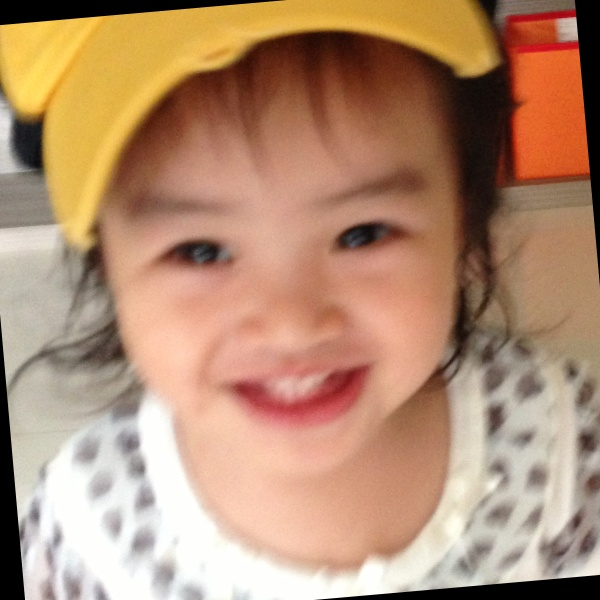

In [57]:
Image(filename='/home/ubuntu/project_pi/images/adience/test_train_adience/1.0/11298446935_12c6af7141_o.jpg')

In [58]:
img_path = 'images/adience/test_train_adience/'
src_path =  img_path
final_path = img_path +'test'
all_folders = sorted([folder for folder in os.listdir(img_path) if os.path.isdir(os.path.join(img_path, folder))])[1:]

for folder in all_folders:
    print('**** in folder' + folder)
    os.mkdir(final_path+'/'+ folder)
    all_files = [file for file in os.listdir(src_path +'/'+ folder) if os.path.isfile(os.path.join(src_path +'/'+ folder, file))]
    num_files=len(all_files)*0.3
    for x in range(int(num_files)):
        file = random.choice(all_files)
        print(str(x)+' ---> Moving: '+src_path+file)
        print('to: '+final_path+'/'+file)
        shutil.move(src_path+folder+'/'+file, final_path+'/'+folder+'/'+file)
        all_files.remove(file)

**** in folder1.0
0 ---> Moving: images/adience/test_train_adience/11309998513_1cc6d447ab_o.jpg
to: images/adience/test_train_adience/test/11309998513_1cc6d447ab_o.jpg
1 ---> Moving: images/adience/test_train_adience/9489552466_1727a0237f_o.jpg
to: images/adience/test_train_adience/test/9489552466_1727a0237f_o.jpg
2 ---> Moving: images/adience/test_train_adience/11133039125_7469534ee1_o.jpg
to: images/adience/test_train_adience/test/11133039125_7469534ee1_o.jpg
3 ---> Moving: images/adience/test_train_adience/11812386595_732c3eb6b5_o.jpg
to: images/adience/test_train_adience/test/11812386595_732c3eb6b5_o.jpg
4 ---> Moving: images/adience/test_train_adience/11843542296_b533e0fa51_o.jpg
to: images/adience/test_train_adience/test/11843542296_b533e0fa51_o.jpg
5 ---> Moving: images/adience/test_train_adience/10349720783_b7d4f74583_o.jpg
to: images/adience/test_train_adience/test/10349720783_b7d4f74583_o.jpg
6 ---> Moving: images/adience/test_train_adience/8520265288_a82d87fa53_o.jpg
to: ima

104 ---> Moving: images/adience/test_train_adience/11779442753_00aec37283_o.jpg
to: images/adience/test_train_adience/test/11779442753_00aec37283_o.jpg
105 ---> Moving: images/adience/test_train_adience/11842627533_b1a9a43612_o.jpg
to: images/adience/test_train_adience/test/11842627533_b1a9a43612_o.jpg
106 ---> Moving: images/adience/test_train_adience/11779612893_235867fcde_o.jpg
to: images/adience/test_train_adience/test/11779612893_235867fcde_o.jpg
107 ---> Moving: images/adience/test_train_adience/11780160046_903683b679_o.jpg
to: images/adience/test_train_adience/test/11780160046_903683b679_o.jpg
108 ---> Moving: images/adience/test_train_adience/12101604433_cc883984b9_o.jpg
to: images/adience/test_train_adience/test/12101604433_cc883984b9_o.jpg
109 ---> Moving: images/adience/test_train_adience/12055303935_74cb11d91e_o.jpg
to: images/adience/test_train_adience/test/12055303935_74cb11d91e_o.jpg
110 ---> Moving: images/adience/test_train_adience/9274499565_166c341ffd_o.jpg
to: image

143 ---> Moving: images/adience/test_train_adience/10198426713_2d61cff93d_o.jpg
to: images/adience/test_train_adience/test/10198426713_2d61cff93d_o.jpg
144 ---> Moving: images/adience/test_train_adience/12120239514_714c4def82_o.jpg
to: images/adience/test_train_adience/test/12120239514_714c4def82_o.jpg
145 ---> Moving: images/adience/test_train_adience/12091718775_d9c04d8a7d_o.jpg
to: images/adience/test_train_adience/test/12091718775_d9c04d8a7d_o.jpg
146 ---> Moving: images/adience/test_train_adience/11431641535_817d8d4905_o.jpg
to: images/adience/test_train_adience/test/11431641535_817d8d4905_o.jpg
147 ---> Moving: images/adience/test_train_adience/9321104635_a11b3580fe_o.jpg
to: images/adience/test_train_adience/test/9321104635_a11b3580fe_o.jpg
148 ---> Moving: images/adience/test_train_adience/10658394946_ded97a189b_o.jpg
to: images/adience/test_train_adience/test/10658394946_ded97a189b_o.jpg
149 ---> Moving: images/adience/test_train_adience/10823337393_90b2d62010_o.jpg
to: images

to: images/adience/test_train_adience/test/11810647204_7c133bf33a_o.jpg
15 ---> Moving: images/adience/test_train_adience/11763294945_b1958ce368_o.jpg
to: images/adience/test_train_adience/test/11763294945_b1958ce368_o.jpg
16 ---> Moving: images/adience/test_train_adience/11808368215_f6ee43ce87_o.jpg
to: images/adience/test_train_adience/test/11808368215_f6ee43ce87_o.jpg
17 ---> Moving: images/adience/test_train_adience/11763968396_0c608ac483_o.jpg
to: images/adience/test_train_adience/test/11763968396_0c608ac483_o.jpg
**** in folder35.0
0 ---> Moving: images/adience/test_train_adience/11756698066_929f4d1560_o.jpg
to: images/adience/test_train_adience/test/11756698066_929f4d1560_o.jpg
1 ---> Moving: images/adience/test_train_adience/8630636902_968a9e9981_o.jpg
to: images/adience/test_train_adience/test/8630636902_968a9e9981_o.jpg
2 ---> Moving: images/adience/test_train_adience/12059945675_dcb2c18074_o.jpg
to: images/adience/test_train_adience/test/12059945675_dcb2c18074_o.jpg
3 ---> M

196 ---> Moving: images/adience/test_train_adience/10693521185_870b6d2a90_o.jpg
to: images/adience/test_train_adience/test/10693521185_870b6d2a90_o.jpg
197 ---> Moving: images/adience/test_train_adience/9230283459_3bfe3bc910_o.jpg
to: images/adience/test_train_adience/test/9230283459_3bfe3bc910_o.jpg
198 ---> Moving: images/adience/test_train_adience/12080454973_4ecef68331_o.jpg
to: images/adience/test_train_adience/test/12080454973_4ecef68331_o.jpg
199 ---> Moving: images/adience/test_train_adience/12109925176_64495ec316_o.jpg
to: images/adience/test_train_adience/test/12109925176_64495ec316_o.jpg
200 ---> Moving: images/adience/test_train_adience/12115882416_d8444df164_o.jpg
to: images/adience/test_train_adience/test/12115882416_d8444df164_o.jpg
201 ---> Moving: images/adience/test_train_adience/8728370085_737f099f37_o.jpg
to: images/adience/test_train_adience/test/8728370085_737f099f37_o.jpg
202 ---> Moving: images/adience/test_train_adience/12111732165_fe2fea4df2_o.jpg
to: images/a

In [61]:
d = {}
for folder in glob('images/adience/test_train_adience/*'):
    d[folder] = len(glob(folder+'/*'))
print(d)

{'images/adience/test_train_adience/15.0': 1, 'images/adience/test_train_adience/36.0': 30, 'images/adience/test_train_adience/1.0': 1137, 'images/adience/test_train_adience/42.0': 1, 'images/adience/test_train_adience/5.0': 807, 'images/adience/test_train_adience/29.0': 34, 'images/adience/test_train_adience/40.0': 805, 'images/adience/test_train_adience/80.0': 264, 'images/adience/test_train_adience/13.0': 44, 'images/adience/test_train_adience/28.0': 1707, 'images/adience/test_train_adience/3.0': 4, 'images/adience/test_train_adience/35.0': 101, 'images/adience/test_train_adience/50.0': 271, 'images/adience/test_train_adience/45.0': 31, 'images/adience/test_train_adience/2.0': 3, 'images/adience/test_train_adience/10.0': 684, 'images/adience/test_train_adience/22.0': 53, 'images/adience/test_train_adience/55.0': 37, 'images/adience/test_train_adience/43.0': 5, 'images/adience/test_train_adience/34.0': 44, 'images/adience/test_train_adience/58.0': 3, 'images/adience/test_train_adienc

In [62]:
e = {}
for folder in glob('images/adience/test_train_adience/test/*'):
    e[folder] = len(glob(folder+'/*'))
print(e)

{'images/adience/test_train_adience/test/15.0': 0, 'images/adience/test_train_adience/test/36.0': 12, 'images/adience/test_train_adience/test/1.0': 487, 'images/adience/test_train_adience/test/42.0': 0, 'images/adience/test_train_adience/test/5.0': 345, 'images/adience/test_train_adience/test/29.0': 14, 'images/adience/test_train_adience/test/40.0': 345, 'images/adience/test_train_adience/test/80.0': 112, 'images/adience/test_train_adience/test/13.0': 18, 'images/adience/test_train_adience/test/28.0': 731, 'images/adience/test_train_adience/test/3.0': 1, 'images/adience/test_train_adience/test/35.0': 42, 'images/adience/test_train_adience/test/50.0': 116, 'images/adience/test_train_adience/test/45.0': 12, 'images/adience/test_train_adience/test/2.0': 0, 'images/adience/test_train_adience/test/10.0': 293, 'images/adience/test_train_adience/test/22.0': 22, 'images/adience/test_train_adience/test/55.0': 15, 'images/adience/test_train_adience/test/43.0': 1, 'images/adience/test_train_adien